In [1]:
# For this notebook to run with updated APIs, we need torch 1.12+ and torchvision 0.13+
try:
    import torch
    import torchvision
    assert int(torch.__version__.split(".")[1]) >= 12, "torch version should be 1.12+"
    assert int(torchvision.__version__.split(".")[1]) >= 13, "torchvision version should be 0.13+"
    print(f"torch version: {torch.__version__}")
    print(f"torchvision version: {torchvision.__version__}")
except:
    print(f"[INFO] torch/torchvision versions not as required, installing nightly versions.")
    !pip3 install -U --pre torch torchvision torchaudio --extra-index-url https://download.pytorch.org/whl/nightly/cu113
    import torch
    import torchvision
    print(f"torch version: {torch.__version__}")
    print(f"torchvision version: {torchvision.__version__}")

torch version: 1.12.1+cu102
torchvision version: 0.13.1+cu102


In [2]:
# Continue with regular imports
import matplotlib.pyplot as plt
import torch
import torchvision

from torch import nn
from torchvision import transforms

# Try to get torchinfo, install it if it doesn't work
try:
    from torchinfo import summary
except:
    print("[INFO] Couldn't find torchinfo... installing it.")
    !pip install -q torchinfo
    from torchinfo import summary

# Try to import the going_modular directory, download it from GitHub if it doesn't work
try:
    from Going_Moduder import data_setup, engine
    from helper_functions import download_data, set_seeds, plot_loss_curves
except:
    # Get the going_modular scripts
    print("[INFO] Couldn't find going_modular or helper_functions scripts... downloading them from GitHub.")
    !git clone https://github.com/mrdbourke/pytorch-deep-learning
    !mv pytorch-deep-learning/going_modular .
    !mv pytorch-deep-learning/helper_functions.py . # get the helper_functions.py script
    !rm -rf pytorch-deep-learning
    from going_modular.going_modular import data_setup, engine
    from helper_functions import download_data, set_seeds, plot_loss_curves

In [3]:
device = "cuda" if torch.cuda.is_available() else "cpu"
device

'cuda'

In [4]:
# Get dataset using download_data()  function from helper_functions.py script 
# Download pizza, steak, sushi images from GitHub
image_path = download_data(source="https://github.com/mrdbourke/pytorch-deep-learning/raw/main/data/pizza_steak_sushi.zip",
                           destination="pizza_steak_sushi")
image_path

[INFO] data/pizza_steak_sushi directory exists, skipping download.


PosixPath('data/pizza_steak_sushi')

In [5]:
# Setup directory paths to train and test images
train_dir = image_path / "train"
test_dir = image_path / "test"

# 2. Create Datasets and DataLoaders¶
use the create_dataloaders() function in data_setup.py script ... 
First, we'll create a transform to prepare our images.

This where one of the first references to the ViT paper will come in.

In Table 3, the training resolution is mentioned as being 224 (height=224, width=224 and batch size of 4096

You can often find various hyperparameter settings listed in a table. In this case we're still preparing our data, so we're mainly concerned with things like image size and batch size. Source: Table 3 in ViT paper.

So we'll make sure our transform resizes our images appropriately.

And since we'll be training our model from scratch (no transfer learning to begin with), we won't provide a normalize transform like we did in 06. PyTorch Transfer Learning section 2.1.

## 2.1 Prepare transforms for images
                                                               
                                                               
                                                               

In [7]:
# Create image size (from Table 3 in the ViT paper) 
IMG_SIZE = 224

# Create transform pipeline manually
manual_transforms = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
])           
print(f"Manually created transforms: {manual_transforms}")

Manually created transforms: Compose(
    Resize(size=(224, 224), interpolation=bilinear, max_size=None, antialias=None)
    ToTensor()
)


## 2.2 Turn images into DataLoader's
Transforms created!

Let's now create our DataLoader's.

The ViT paper states the use of a batch size of 4096 which is 128x the size of the batch size we've been using (32).

However, we're going to stick with a batch size of 32.

Why?

Because some hardware (including the free tier of Google Colab) may not be able to handle a batch size of 4096.

### Having a batch size of 4096 means that 4096 images need to fit into the GPU memory at a time.

This works when you've got the hardware to handle it like a research team from Google often does but when you're running on a single GPU (such as using Google Colab), making sure things work with smaller batch size first is a good idea.

An extension of this project could be to try a higher batch size value and see what happens.

Note: We're using the pin_memory=True parameter in the create_dataloaders() function to speed up computation. pin_memory=True avoids unnecessary copying of memory between the CPU and GPU memory by "pinning" examples that have been seen before. Though the benefits of this will likely be seen with larger dataset sizes (our FoodVision Mini dataset is quite small). However, setting pin_memory=True doesn't always improve performance (this is another one of those we're scenarios in machine learning where some things work sometimes and don't other times), so best to experiment, experiment, experiment. See the PyTorch torch.utils.data.DataLoader documentation or Making Deep Learning Go Brrrr from First Principles by Horace He for more.

In [8]:
# Set the batch size
BATCH_SIZE = 32 # this is lower than the ViT paper but it's because we're starting small

# Create data loaders
train_dataloader, test_dataloader, class_names = data_setup.create_dataloaders(
    train_dir=train_dir,
    test_dir=test_dir,
    transform=manual_transforms, # use manually created transforms
    batch_size=BATCH_SIZE
)

train_dataloader, test_dataloader, class_names

(<torch.utils.data.dataloader.DataLoader at 0x7fcb5db39eb0>,
 ['pizza', 'steak', 'sushi'])

## 2.3 Visualize a single image
Now we've loaded our data, let's visualize, visualize, visualize!

An important step in the ViT paper is preparing the images into patches.

We'll get to what this means in section 4 but for now, let's view a single image and its label.

To do so, let's get a single image and label from a batch of data and inspect their shapes.

In [ ]:
# Get a batch of images
image_batch, label_batch = next(iter(train_dataloader))

# Get a single image from the batch
image, label = image_batch[0], label_batch[0]

# View the batch shapes
image.shape, label

In [ ]:
plt.imshow(img.permute(1,2,0))# Rearrange image dimensions to suit matplotlib [color_channels, height, width] -> [hight, widht, color_channels]
plt.title(class_names[label])
plt.axis('off')

# 3. Replicating the ViT paper: an overview

We'd like to replicate the ViT paper for our own problem, FoodVision Mini.

So our model inputs are: images of pizza, steak and sushi.

And our ideal model outputs are: predicted labels of pizza, steak or sushi.

No different to what we've been doing throughout the previous sections.

The question is: how do we go from our inputs to the desired outputs?

## 3.1 Inputs and outputs, layers and blocks
'ViT' is a deep learning neural network architecture.

And any neural network architecture is generally comprised of layers.

And a collection of layers is often referred to as a block.

And stacking many blocks together is what gives us the whole architecture.

A layer takes an input (say an image tensor), performs some kind of function on it (for example what's in the layer's forward() method) and then returns an output.

So if a single layer takes an input and gives an output, then a collection of layers or a block also takes an input and gives an output.

Let's make this concrete:

1. Layer - takes an input, performs a function on it, returns an output.
2. Block - a collection of layers, takes an input, performs a series of functions on it, returns an output.
3. Architecture (or model) - a collection of blocks, takes an input, performs a series of functions on it, returns an output.

This ideology is what we're going to be using to replicate the ViT paper.

We're going to take it ### layer by layer, block by block, function by function putting the pieces of the puzzle together like Lego to get our desired overall architecture.

The reason we do this is because looking at a whole research paper can be intimidating.

So for a better understanding, we'll break it down, starting with the inputs and outputs of single layer and working up to the inputs and outputs of the whole model.

A modern deep learning architecture is usually collection of layers and blocks. Where layers take an input (data as a numerical representation) and manipulate it using some kind of function (for example, the self-attention formula pictured above, however, this function could be almost anything) and then output it. Blocks are generally stacks of layers on top of each other doing a similar thing to a single layer but multiple times.





## 3.2 Getting specific: What's ViT made of?
There are many little details about the ViT model sprinkled throughout the paper.

Finding them all is like one big treasure hunt!

Remember, a research paper is often months of work compressed into a few pages so it's understandable for it to take of practice to replicate.

However, the main three resources we'll be looking at for the architecture design are:

1. Figure 1 - This gives an overview of the model in a graphical sense, you could almost recreate the architecture with this figure alone.
2. Four equations in section 3.1 - These equations give a little bit more of a mathematical grounding to the coloured blocks in Figure 1.
3. Table 1 - This table shows the various hyperparameter settings (such as number of layers and number of hidden units) for different ViT model variants. We'll be focused on the smallest version, ViT-Base.

## 3.2.1 Exploring Figure 1
Let's start by going through Figure 1 of the ViT Paper.

The main things we'll be paying attention to are:

1. Layers - takes an input, performs an operation or function on the input, produces an output.
2. Blocks - a collection of layers, which in turn also takes an input and produces an output.

Figure 1 from the ViT Paper showcasing the different inputs, outputs, layers and blocks that create the architecture. Our goal will be to replicate each of these using PyTorch code.

### The ViT architecture is comprised of several stages:

1. Patch + Position Embedding (inputs) - Turns the input image into a sequence of image patches and add a position number what order the patch comes in.
2. Linear projection of flattened patches (Embedded Patches) - The image patches get turned into an embedding, the benefit of using an embedding rather than just the image values is that an embedding is a learnable representation (typically in the form of a vector) of the image that can improve with training.
2. Norm - This is short for "Layer Normalization" or "LayerNorm", a technique for regularizing (reducing overfitting) a neural network, you can use LayerNorm via the PyTorch layer torch.nn.LayerNorm().
3. Multi-Head Attention - This is a Multi-Headed Self-Attention layer or "MSA" for short. You can create an MSA layer via the PyTorch layer torch.nn.MultiheadAttention().
4. MLP (or Multilayer perceptron) - A MLP can often refer to any collection of feedforward layers (or in PyTorch's case, a collection of layers with a forward() method). In the ViT Paper, the authors refer to the MLP as "MLP block" and it contains two torch.nn.Linear() layers with a torch.nn.GELU() non-linearity activation in between them (section 3.1) and a torch.nn.Dropout() layer after each (Appendex B.1).
5. Transformer Encoder - The Transformer Encoder, is a collection of the layers listed above. There are two skip connections inside the Transformer encoder (the "+" symbols) meaning the layer's inputs are fed directly to immediate layers as well as subsequent layers. The overall ViT architecture is comprised of a number of Transformer encoders stacked on top of eachother.
6. MLP Head - This is the output layer of the architecture, it converts the learned features of an input to a class output. Since we're working on image classification, you could also call this the "classifier head". The structure of the MLP Head is similar to the MLP block.

You might notice that many of the pieces of the ViT architecture can be created with existing PyTorch layers.

This is because of how PyTorch is designed, it's one of the main purposes of PyTorch to create reusable neural network layers for both researchers and machine learning practitioners.

### Question: Why not code everything from scratch?

You could definitely do that by reproducing all of the math equations from the paper with custom PyTorch layers and that would certainly be an educative exercise, however, using pre-existing PyTorch layers is usually favoured as 
##### pre-existing layers have often been extensively tested and performance checked to make sure they run correctly and fast.

Note: We're going to focused on write PyTorch code to create these layers, for the background on what each of these layers does, I'd suggest reading the ViT Paper in full or reading the linked resources for each layer.

Let's take Figure 1 and adapt it to our FoodVision Mini problem of classifying images of food into pizza, steak or sushi.

Figure 1 from the ViT Paper adapted for use with FoodVision Mini. An image of food goes in (pizza), the image gets turned into patches and then projected to an embedding. The embedding then travels through the various layers and blocks and (hopefully) the class "pizza" is returned.

### 3.2.2 Exploring the Four Equations
The next main part(s) of the ViT paper we're going to look at are the four equations in section 3.1.

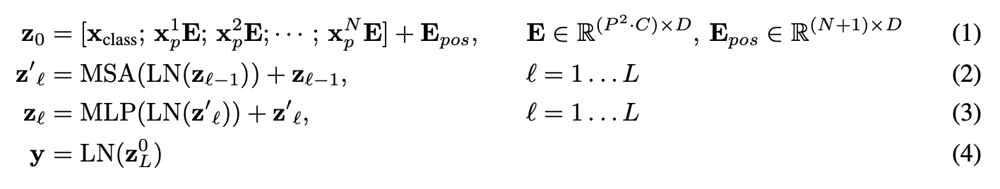

These four equations represent the math behind the four major parts of the ViT architecture.

Section 3.1 describes each of these (some of the text has been omitted for brevity, bolded text is mine):

Equation number	Description from ViT paper section 3.1
1	...The Transformer uses constant latent vector size 
D
 through all of its layers, so we flatten the patches and map to 
D
 dimensions with a trainable linear projection (Eq. 1). We refer to the output of this projection as the patch embeddings... Position embeddings are added to the patch embeddings to retain positional information. We use standard learnable 1D position embeddings...
2	The Transformer encoder (Vaswani et al., 2017) consists of alternating layers of multiheaded selfattention (MSA, see Appendix A) and MLP blocks (Eq. 2, 3). Layernorm (LN) is applied before every block, and residual connections after every block (Wang et al., 2019; Baevski & Auli, 2019).
3	Same as equation 2.
4	Similar to BERT's [ class ] token, we prepend a learnable embedding to the sequence of embedded patches 
(
z
0
0
=
x
class 
)
, whose state at the output of the Transformer encoder 
(
z
0
L
)
 serves as the image representation 
y
 (Eq. 4)...  Let's map these descriptions to the ViT architecture in Figure 1.

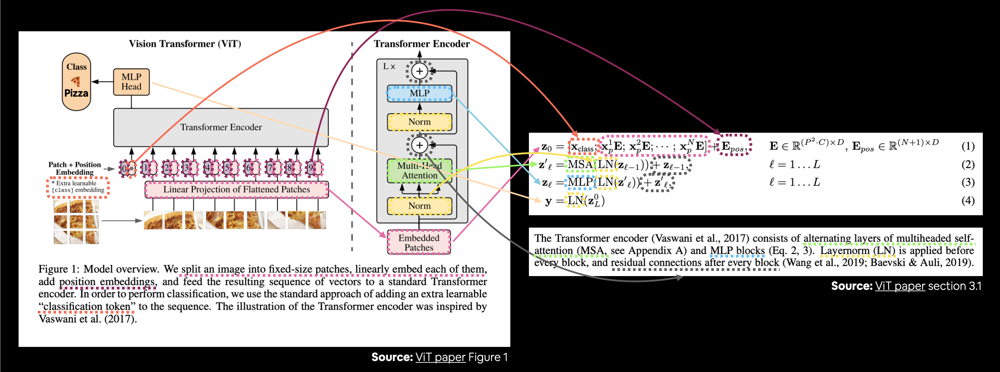

Connecting Figure 1 from the ViT paper to the four equations from section 3.1 describing the math behind each of the layers/blocks.

There's a lot happening in the image above but following the coloured lines and arrows reveals the main concepts of the ViT architecture.

How about we break down each equation further (it will be our goal to recreate these with code)?

In all equations (except equation 4), "
z
" is the raw output of a particular layer:

1. z_0
 is "z zero" (this is the output of the initial patch embedding layer).
2. z_′ℓ
 is "z of a particular layer prime" (or an intermediary value of z).
3. z_ℓ
 is "z of a particular layer".
And 
4. y
 is the overall output of the architecture.
 
 
### 3.2.3 Equation 1 overview
z
0
=
[
x
class 
;
x
1
p
E
;
x
2
p
E
;
⋯
;
x
N
p
E
]
+
E
pos 
,
E
∈
R
(
P
2
⋅
C
)
×
D
,
E
pos 
∈
R
(
N
+
1
)
×
D
This equation deals with the class token, patch embedding and position embedding (
E
 is for embedding) of the input image.

In vector form, the embedding might look something like:

x_input = [class_token, image_patch_1, image_patch_2, image_patch_3...] + [class_token_position, image_patch_1_position, image_patch_2_position, image_patch_3_position...]

## Where each of the elements in the vector is learnable (their requires_grad=True).

### 3.2.4 Equation 2 overview
z
′
ℓ
=
MSA
(
LN
(
z
ℓ
−
1
)
)
+
z
ℓ
−
1
,
ℓ
=
1
…
L
This says that for every layer from 
1
 through to 
L
 (the total number of layers), there's a Multi-Head Attention layer (MSA) wrapping a LayerNorm layer (LN).

# The addition on the end is the equivalent of adding the input to the output and forming a skip/residual connection.

We'll call this layer the "MSA block".

In pseudocode, this might look like:

x_output_MSA_block = MSA_layer(LN_layer(x_input)) + x_input
# Notice the skip connection on the end (adding the input of the layers to the output of the layers).


### 3.2.5 Equation 3 overview
z
ℓ
=
MLP
(
LN
(
z
′
ℓ
)
)
+
z
′
ℓ
,
ℓ
=
1
…
L
This says that for every layer from 
1
 through to 
L
 (the total number of layers), there's also a Multilayer Perceptron layer (MLP) wrapping a LayerNorm layer (LN).

# The addition on the end is showing the presence of a skip/residual connection.

We'll call this layer the "MLP block".

In pseudocode, this might look like:

x_output_MLP_block = MLP_layer(LN_layer(x_output_MSA_block)) + x_output_MSA_block

# Notice the skip connection on the end (adding the input of the layers to the output of the layers).





### 3.2.6 Equation 4 overview
y
=
LN
(
z
0
L
)
This says for the last layer 
L
, the output 
y
 is the 0 index token of 
z
 wrapped in a LayerNorm layer (LN).

Or in our case, the 0 index of x_output_MLP_block:

y = LN_layer(Linear_layer(x_output_MLP_block[0]))
Of course there are some simplifications above but we'll take care of those when we start to write PyTorch code for each section.

Note: The above section covers alot of information. But don't forget if something doesn't make sense, you can always research it further. By asking questions like "what is a residual connection?". 

### 3.2.7 Exploring Table 1
The final piece of the ViT architecture puzzle we'll focus on (for now) is Table 1. Table 1: Details of Vision Transformer model variants. Source: ViT paper.

## Model	Layers	Hidden sizeD MLP size	Heads	Params

# ViT-Base	12	  768	        307        12	     86M

# ViT-Large	24	 1024	      4096	     16	       307M


# ViT-Huge	32	 1280    	 5120	     16	       632M


This table showcasing the various hyperparameters of each of the ViT architectures.

You can see the numbers gradually increase from ViT-Base to ViT-Huge.

We're going to focus on replicating ViT-Base (start small and scale up when necessary) but we'll be writing code that could easily scale up to the larger variants.

# Breaking the hyperparameters down:

1. Layers - How many Transformer Encoder blocks are there? (each of these will contain a MSA block and MLP block)
2. Hidden size_D - This is the embedding dimension throughout the architecture, this will be the size of the vector that our image gets turned into when it gets patched and embedded. Generally, the larger the embedding dimension, the more information can be captured, the better results. However, a larger embedding comes at the cost of more compute.
MLP size - What are the number of hidden units in the MLP layers?
Heads - How many heads are there in the Multi-Head Attention layers?
Params - What are the total number of parameters of the model? Generally, more parameters leads to better performance but at the cost of more compute. You'll notice even ViT-Base has far more parameters than any other model we've used so far.
We'll use these values as the hyperparameter settings for our ViT architecture.

## 3.3 My workflow for replicating papers
When I start working on replicating a paper, I go through the following steps:


1. Read the whole paper end-to-end once (to get an idea of the main concepts).
2. Go back through each section and see how they line up with each other and start thinking about how they might be turned into code (just like above).
3. Repeat step 2 until I've got a fairly good outline.
4. Use mathpix.com (a very handy tool) to turn any sections of the paper into markdown/LaTeX to put into notebooks.
5. Replicate the simplest version of the model possible.
6. If I get stuck, look up other examples.

Turning the four equations from the ViT paper into editable LaTeX/markdown using mathpix.com.

We've already gone through the first few steps above (and if you haven't read the full paper yet, I'd encourage you to give it a go) but what we'll be focusing on next is step 5: replicating the simplest version fo the model possible.

This is why we're starting with ViT-Base.

# Replicating the smallest version of the architecture possible, get it working and then we can scale up if we wanted to.

#### Note: If you've never read a research paper before, many of the above steps can be intimidating. But don't worry, like anything, your skills at reading and replicating papers will improve with practice. Don't forget, a research paper is often months of work by many people compressed into a few pages. So trying to replicate it on your own is no small feat.



# 4. Equation 1: Split data into patches and creating the class, position and patch embedding
I remember one of my machine learning engineer friends used to say 
# "it's all about the embedding."

#### As in, if you can represent your data in a good, learnable way (as embeddings are learnable representations), chances are, a learning algorithm will be able to perform well on them.

With that being said, let's start by creating the class, position and patch embeddings for the ViT architecture.

We'll start with the patch embedding.

This means we'll be 
- turning our input images in a sequence of patches and then embedding those patches.

Recall that an 
- embedding is a learnable representation of some form and is often a vector.

- The term learnable is important because this means the numerical representation of an input image (that the model sees) can be improved over time.

We'll begin by following the opening paragraph of section 3.1 of the ViT paper (bold mine):

-The standard Transformer receives as input a 1D sequence of token embeddings. To handle 2D images, we reshape the image 
x
∈
R
H
×
W
×
C
 into a sequence of flattened 2D patches 
x
p
∈
R
N
×
(
P
2
⋅
C
)
, where 
(
H
,
W
)
 is the resolution of the original image, 
C
 is the number of channels, 
(
P
,
P
)
 is the resolution of each image patch, and 
N
=
H
W
/
P
2
 is the resulting number of patches, which also serves as the effective input sequence length for the Transformer. The Transformer uses constant latent vector size 
D
 through all of its layers, so we flatten the patches and map to 
D
 dimensions with a trainable linear projection (Eq. 1). We refer to the output of this projection as the patch embeddings.


And size we're dealing with image shapes, let's keep in mind the line from Table 3 of the ViT paper:

Training resolution is 224.

Let's break down the text above.

D
 is the size of the patch embeddings, different values for 
D
 for various sized ViT models can be found in Table 1.
The image starts as 2D with size 
H
×
W
×
C
.
(
H
,
W
)
 is the resolution of the original image (height, width).
C
 is the number of channels.
The image gets converted to a sequence of flattened 2D patches with size 
N
×
(
P
2
⋅
C
)
.
(
P
,
P
)
 is the resolution of each image patch (patch size).
N
=
H
W
/
P
2
 is the resulting number of patches, which also serves as the input sequence length for the Transformer.


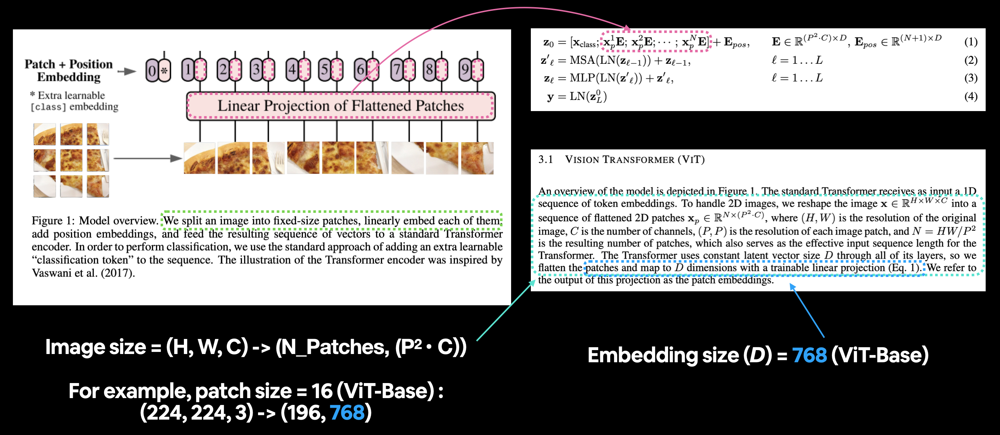
Mapping the patch and position embedding portion of the ViT architecture from Figure 1 to Equation 1. The opening paragraph of section 3.1 describes the different input and output shapes of the patch embedding layer.

Mapping the patch and position embedding portion of the ViT architecture from Figure 1 to Equation 1. The opening paragraph of section 3.1 describes the different input and output shapes of the patch embedding layer.


## 4.1 Calculating patch embedding input and output shapes by hand
How about we start by calculating these input and output shape values by hand?

To do so, let's create some variables to mimic each of the terms (such as 
H
, 
W
 etc) above.

We'll use a patch size (
P
) of 16 since it's the best performing version of ViT-Base uses (see column "ViT-B/16" of Table 5 in the ViT paper for more).

In [ ]:
# Create example values
height = 224 # H ("The training resolution is 224.")
width = 224 # W
color_channels = 3 # C
patch_size = 16 # P

# Calculate N (number of patches)
number_of_patches = int((height * width) / patch_size**2)
print(f"Number of patches (N) with image height (H={height}), width (W={width})")
print(f"and patch size (P={patch_size}): {number_of_patches}")

We've got the number of patches, how about we create the image output size as well?

Better yet, let's replicate the input and output shapes of the patch embedding layer.

Recall:

Input: The image starts as 2D with size 
H
×
W
×
C
.
Output: The image gets converted to a sequence of flattened 2D patches with size 
N
×
(
P^2
⋅
C
)
.

In [ ]:
# Input shape (this is the size of a single image)
embedding_layer_input_shape = (height, width, color_channels)

# Output shape
embedding_layer_output_shape = (number_of_patches, patch_size**2 * color_channels)

print(f"Input shape (single 2D image): {embedding_layer_input_shape}")
print(f"Output shape (single 2D image flattened into patches): {embedding_layer_output_shape}")

In [ ]:
# Input shape (this is the size of a single image)
embedding_layer_input_shape = (height, width, color_channels)

#Output shape
embedding_layer_output_shape = (number_of_patches, patch_size**2 * color_channels)


print(f"Input shape (single 2D image): {embedding_layer_input_shape}" )
print(f"Output shape (single 2D image flattened into patches): {embedding_layer_output_shape}")

4.2 Turning a single image into patches
Now we know the ideal input and output shapes for our patch embedding layer, let's move towards making it.

What we're doing is breaking down the overall architecture into smaller pieces, focusing on the inputs and outputs of individual layers.

##### So how do we create the patch embedding layer?

We'll get to that shortly, first, let's visualize, visualize, visualize! what it looks like to turn an image into patches.

Let's start with our single image.

In [ ]:
# View single image
plt.imshow(image.permute(1, 2, 0)) # adjust for matplotlib
plt.title(class_names[label])
plt.axis(False);

We want to turn this image into patches of itself inline with Figure 1 of the ViT paper.

#### How about we start by just visualizing the top row of patched pixels?

We can do this by indexing on the different image dimensions.

In [ ]:
# Change image shape to be compatible with matplotlib (color_channels, height, widht) -> (height, width, color_channels)
image_permuted = image.permute(1, 2,0)

image_permuted.shape

In [ ]:
# Indexing to plot the top row of patched pixels 
patch_size = 16
plt.figure(figsize=(patch_size, patch_size))
plt.imshow(image_permuted[:patch_size, :, :])

Now we've got the top row, let's turn it into patches.

We can do this by iterating through the number of patches there'd be in the top row.

In [ ]:
# Setup hyperparameters and make sure img_size and patch_size are compatible

img_size = 224
patch_size = 16
num_patches = img_size  / patch_size 
#num_patchesS = img_size ** 2 / patch_size ** 2
assert img_size % patch_size == 0, "Image size must be devisible by patch size"

print(f"Number of patches per row: {num_patches}\nPatch_size: {patch_size} pixels x {patch_size} pixels")



#Create a series of subplots 
fig, axs = plt.subplots(nrows=1,
                       ncols=img_size // patch_size, # one column for each patch
                       figsize=(num_patches, num_patches),
                       sharex=True,
                       sharey=True)

#Iterate through number of patches in the top row 
for i, patch in enumerate(range(0, img_size, patch_size)):
    axs[i].imshow(image_permuted[:patch_size, patch:patch+patch_size, :]) # keep height index constant, alter the width index
    axs[i].set_xlabel(i+1) # set the label
    axs[i].set_xticks([])
    axs[i].set_yticks([])

 Those are some nice looking patches!

How about we do it for the whole image?

This time we'll iterate through the indexs for height and width and plot each patch as it's own subplot.

In [ ]:
# Setup hyperparameters and make sure img_size and patch_size are compatible
img_size = 224
patch_size = 16
num_patches = img_size/patch_size 
assert img_size % patch_size == 0, "Image size must be divisible by patch size" 
print(f"Number of patches per row: {num_patches}\
        \nNumber of patches per column: {num_patches}\
        \nTotal patches: {num_patches*num_patches}\
        \nPatch size: {patch_size} pixels x {patch_size} pixels")

# Create a series of subplots
fig, axs = plt.subplots(nrows=img_size // patch_size, # need int not float //
                        ncols=img_size // patch_size, 
                        figsize=(num_patches, num_patches),
                        sharex=True,
                        sharey=True)

# Loop through height and width of image
for i, patch_height in enumerate(range(0, img_size, patch_size)): # iterate through height
    for j, patch_width in enumerate(range(0, img_size, patch_size)): # iterate through width
        
        # Plot the permuted image patch (image_permuted -> (Height, Width, Color Channels))
        axs[i, j].imshow(image_permuted[patch_height:patch_height+patch_size, # iterate through height 
                                        patch_width:patch_width+patch_size, # iterate through width
                                        :]) # get all color channels
        
        # Set up label information, remove the ticks for clarity and set labels to outside
        axs[i, j].set_ylabel(i+1, 
                             rotation="horizontal", 
                             horizontalalignment="right", 
                             verticalalignment="center") 
        axs[i, j].set_xlabel(j+1) 
        axs[i, j].set_xticks([])
        axs[i, j].set_yticks([])
        axs[i, j].label_outer()

# Set a super title
fig.suptitle(f"{class_names[label]} -> Patchified", fontsize=16)
plt.show()

Image patchified!

Woah, that looks cool.

Now how do we turn each of these patches into an embedding and convert them into a sequence?

Hint: we can use PyTorch layers. Can you guess which?

## 4.3 Creating image patches with torch.nn.Conv2d()
We've seen what an image looks like when it gets turned into patches, now let's start moving towards replicating the patch embedding layers with PyTorch.

To visualize our single image we wrote code to loop through the different height and width dimensions of a single image and plot individual patches.

This operation is very similar to the convolutional operation we saw in 03. PyTorch Computer Vision section 7.1: Stepping through nn.Conv2d().

In fact, the authors of the ViT paper mention in section 3.1 that the patch embedding is achievable with a convolutional neural network (CNN):


1. Hybrid Architecture. As an alternative to raw image patches, the input sequence can be formed from feature maps of a CNN (LeCun et al., 1989). In this hybrid model, the patch embedding projection 
E
 (Eq. 1) is applied to patches extracted from a CNN feature map. As a special case, the patches can have spatial size 
1
×
1
, which means that the input sequence is obtained by simply flattening the spatial dimensions of the feature map and projecting to the Transformer dimension. The classification input embedding and position embeddings are added as described above.

2. The "feature map" they're refering to are the weights/activations produced by a convolutional layer passing over a given image.


By setting the 
# kernel_size and 
#  stride 
parameters of a torch.nn.Conv2d() layer 
# equal to the patch_size, 
we can effectively get a layer that
# splits our image into patches 
and 
# creates a learnable embedding
(referred to as a 
# "Linear Projection" 
in the ViT paper) of each patch.

Remember our ideal input and output shapes for the patch embedding layer?

1. Input: The image starts as 2D with size 
H
×
W
×
C
.
2. Output: The image gets converted to a 1D sequence of flattened 2D patches with size 
N
×
(
P
2
⋅
C
)
.


Or for an image size of 224 and patch size of 16:

1. Input (2D image): (224, 224, 3) -> (height, width, color channels)
2. Output (flattened 2D patches): (196, 768) -> (number of patches, embedding dimension)


We can recreate these with:

1. torch.nn.Conv2d() for turning our image into patches of CNN feature maps.
2. torch.nn.Flatten() for flattening the spatial dimensions of the feature map.
Let's start with the torch.nn.Conv2d() layer.



We can replicate the creation of patches by setting the kernel_size and stride equal to patch_size.

1. This means each convolutional kernel will be of size (patch_size x patch_size) or if patch_size=16, (16 x 16) (the equivalent of one whole patch).

2. And each step or stride of the convolutional kernel will be patch_size pixels long or 16 pixels long (equivalent of stepping to the next patch).

3. We'll set in_channels=3 for the number of color channels in our image and we'll set out_channels=768, the same as the 
D
 value in Table 1 for ViT-Base (this is the embedding dimension, each image will be embedded into a learnable vector of size 768).

In [ ]:
from torch import nn

# set the patch size
patch_size = 16 

#Create the Conv2d layer with hyperparameters from the ViT paper 
conv2d = nn.Conv2d(in_channels=3, # number of color channels
                  out_channels=768, # hidden size D, this is the embedding size
                  kernel_size=patch_size, # could also use (patch_size, patch_size)
                  stride=patch_size,
                  padding=0)

In [ ]:
#Now we've got a convoluational layer, let's see what happens when we pass a single image through it.
# View single image
plt.imshow(image.permute(1,2,0)) # adjust for matplotlib
plt.title(class_names[label])
plt.axis(False)

In [ ]:
# Pass the image throught the convolutional layer 
image_out_of_conv = conv2d(image.unsqueeze(0)) # add a single batch dimenstion (height, widht, color_channels) -> [batch, height, width, color_channels]
print(image_out_of_conv.shape)

Passing our image through the convolutional layer turns it into a series of 768 (this is the embedding size or 
D
) feature/activation maps.

So its output shape can be read as:

torch.Size([1, 768, 14, 14]) -> [batch_size, embedding_dim, feature_map_height, feature_map_width]

Let's visualize five random feature maps and see what they look like.



In [ ]:
# Plot random 5 convolutional feature maps
import random
random_indexes = random.sample(range(0, 758), k=5) # pick 5 numbers between 0 and the embedding size
print(f"Showing random convolutional feature maps from indexes: {random_indexes}")

# Create plot
fig, axs = plt.subplots(nrows=1, ncols=5, figsize=(12, 12))

# Plot random image feature maps
for i, idx in enumerate(random_indexes):
    image_conv_feature_map = image_out_of_conv[:, idx, :, :] # index on the output tensor of the convolutional layer
    axs[i].imshow(image_conv_feature_map.squeeze().detach().numpy())
    axs[i].set(xticklabels=[], yticklabels=[], xticks=[], yticks=[]);

Notice how the feature maps all kind of represent the original image, after visualizing a few more you can start to see the different major outlines and some major features.

# The important thing to note is that these features may change over time as the neural network learns.

### And because of these, these feature maps can be considered a learnable embedding of our image.

Let's check one out in numerical form.

In [ ]:
# Get a single feature map in tensor form
single_feature_map = image_out_of_conv[:, 0, :, :]
single_feature_map, single_feature_map.shape, single_feature_map.requires_grad

The grad_fn output of the single_feature_map and the requires_grad=True attribute means PyTorch is tracking the gradients of this feature map and it will be updated by gradient descent during training.

## 4.4 Flattening the patch embedding with torch.nn.Flatten()
We've turned our image into patch embeddings but they're still in 2D format.

How do we get them into the desired output shape of the patch embedding layer of the ViT model?

- Desried output (1D sequence of flattened 2D patches): (196, 768) -> (number of patches, embedding dimension) -> 
N
×
(
P
2
⋅
C
)
Let's check the current shape.


In [ ]:
n_size = 224
p_size = 16
c = 3
n_patches = n_size ** 2 // p_size**2 
embed_D =   (p_size**2 * c)
n_patches , embed_D

In [ ]:
# Current tensor shape
print(f"Current tensor shape: {image_out_of_conv.shape} -> [batch, embedding_dim, feature_map_height, feature_map_width ]")

Well we've got the 768 part ( 
(
P
2
⋅
C
)
 ) but we still need the number of patches (
N
).

Reading back through section 3.1 of the ViT paper it says (bold mine):

# As a special case, the patches can have spatial size 
1
×
1
, 
## which means that the input sequence is obtained by simply flattening the spatial dimensions of the feature map and projecting to the Transformer dimension.

Flattening the spatial dimensions of the feature map hey?

What layer do we have in PyTorch that can flatten?

- How about torch.nn.Flatten()?

But we don't want to flatten the whole tensor, we only want to flatten the "spatial dimensions of the feature map".

Which in our case is the feature_map_height and feature_map_width dimensions of image_out_of_conv.

- So how about we create a torch.nn.Flatten() layer to only flatten those dimensions, we can use the start_dim and end_dim parameters to set that up?

In [ ]:
# Create flatten layer
flatten = nn.Flatten(start_dim=2,# flatten feature_map_heigth (dimension = 2)
                    end_dim=3) # flatten feature_map_width (dimension = 3)



Nice! Now let's put it all together!

We'll:

1. Take a single image.
2. Put in through the convolutional layer (conv2d) to turn the image into 2D feature maps (patch embeddings).
3. Flatten the 2D feature map into a single sequence.

In [ ]:
#1. View single image
plt.imshow(image.permute(1, 2, 0)) # adjust for matplotlib
plt.title(class_names[label])
plt.axis(False)
print(f"Original image shape: {image.shape}")

#2. Turn image into feature maps
image_out_of_conv = conv2d(image.unsqueeze(0)) # add batch dimension to avoid shape mismatch error

print(f"Image feature map shape: {image_out_of_conv.shape}")


#3. Flatten the feature maps
image_out_of_conv_flattened = flatten(image_out_of_conv)
print(f"Flattened image feature map shape: {image_out_of_conv_flattened.shape}")

Woohoo! It looks like our image_out_of_conv_flattened shape is very close to our desired output shape:

1. Desried output (flattened 2D patches): (196, 768) -> 
N
×
(
P
2
⋅
C
)
2. Current shape: (1, 768, 196)
The only difference is our current shape has a batch size and the dimensions are in a different order to the desired output.

How could we fix this?

Well, how about we rearrange the dimensions?

We can do so with torch.Tensor.permute() just like we do when rearranging image tensors to plot them with matplotlib.

Let's try.

In [ ]:
# Get flattened image patch embeddings in right shape 
image_out_of_conv_flattened_reshaped = image_out_of_conv_flattened.permute(0, 2, 1) # [batch_size, P^2•C, N] -> [batch_size, N, P^2•C]
print(f"Patch embedding sequence shape: {image_out_of_conv_flattened_reshaped.shape} -> [batch_size, num_patches, embedding_size]")

We've now matched the desired input and output shapes for the patch embedding layer of the ViT architecture using a couple of PyTorch layers.

How about we visualize one of the flattened feature maps?

In [ ]:
# Get a single flattened feature map
single_flattened_feature_map = image_out_of_conv_flattened_reshaped[:, :, 0] # index: (batch_size, number_of_patches, embedding_dimension)

# Plot the flattened feature map visually
plt.figure(figsize=(22, 22))
plt.imshow(single_flattened_feature_map.detach().numpy())
plt.title(f"Flattened feature map shape: {single_flattened_feature_map.shape}")
plt.axis(False);

Hmm, the flattened feature map doesn't look like much visually, but that's not what we're concerned about, this is what will be the output of the patching embedding layer and the input to the rest of the ViT architecture.

- Note: The original Transformer architecture was designed to work with text. The Vision Transformer architecture (ViT) had the goal of using the original Transformer for images. This is why the input to the ViT architecture is processed in the way it is. We're essentially taking a 2D image and formatting it so it appears as a 1D sequence of text.

#### How about we view the flattened feature map in tensor form?



In [ ]:
# See the flattened feature map as a tensor
single_flattened_feature_map, single_flattened_feature_map.requires_grad, single_flattened_feature_map.shape

### We've turned our single 2D image into a 1D learnable embedding vector (or "Linear Projection of Flattned Patches" in Figure 1 of the ViT paper).


## 4.5 Turning the ViT patch embedding layer into a PyTorch module¶

Time to put everything we've done for creating the patch embedding into a single PyTorch layer.

We can do so by subclassing nn.Module and creating a small PyTorch "model" to do all of the steps above.

Specifically we'll:


1. Create a class called PatchEmbedding which subclasses nn.Module (so it can be used a PyTorch layer).
2. Initialize the class with the parameters in_channels=3, patch_size=16 (for ViT-Base) and embedding_dim=768 (this is $D$ for ViT-Base from Table 1).
3. Create a layer to turn an image into patches using nn.Conv2d() (just like in 4.3 above).
4. Create a layer to flatten the patch feature maps into a single dimension (just like in 4.4 above).
5. Define a forward() method to take an input and pass it through the layers created in 3 and 4.
6. Make sure the output shape reflects the required output shape of the ViT architecture (${N \times\left(P^{2} \cdot C\right)}$).
Let's do it!



In [ ]:
# Create a class which is a subclasses nn.Module
class PatchEmbedding(nn.Module):
    """
    Turns a 2D input image into a 1D sequence learnable embedding vector.
    
    Args:
        in_channels (int): Number of color channels for the input images. Defaults to 3.
        patch_size (int): SIze of patches to convert input image into. Default is 16.
        embedding_dim (int): Size of embedding to turn image into. Defaults to 768.
    """
    
    # 2. Initialize the class with appropriate variables 
    def __init__(self,
                 in_channels:int=3,
                 patch_size:int=16,
                 embedding_dim:int=768):
        super().__init__()
        
        #3. Create a layer to turn an image into patches using Conv2d
        self.patcher = nn.Conv2d(in_channels=in_channels,
                                out_channels=embedding_dim,
                                kernel_size=patch_size,
                                stride=patch_size,
                                padding=0)

        #4. Creat a layer to flatten the patch feature maps into a single dimension 
        self.flatten = nn.Flatten(start_dim=2,#only flatten the feature map dimensions into a single vector
                                  end_dim=3
                                 )

    
    # Define the forward method 
    def forward(self, x):
        # Create assertion to check that inputs are the correct shape ... 
        image_resolution = x.shape[-1]
        assert image_resolution % patch_size == 0, f"Input image size must be divisble by patch size, image shape : {image_resolution}, patch size: {patch_size}"
        
        
        # Perform the forward pass 
        x_patched = self.patcher(x)
        x_flattened = self.flatten(x_patched)
        
        return x_flattened.permute(0, 2, 1) # adjust so the embedding is on teh final dimension [batch_size, P^2*C, N] -> [batch_size, N, P^2*C]

# PatchEmbedding layer created! Let's try it out on a single image.



In [ ]:
set_seeds()

# Create an instance of patch embedding layer
patchify = PatchEmbedding(in_channels=3,
                         patch_size=16,
                         embedding_dim=768)


# Pass a single image through 
print(f"Input image shape: {image.shape} \n Image shape after squeezing {image.unsqueeze(0).shape}")
patch_embedded_image = patchify(image.unsqueeze(0)) # Add an extra batch dimension onthe 0th index, otherwise will error
print(f"Output patch embedding shape: {patch_embedded_image.shape}")



The output shape matches the ideal input and output shapes we'd like to see from the patch embedding layer:

1. Input: The image starts as 2D with size 
H
×
W
×
C
.
2. Output: The image gets converted to a 1D sequence of flattened 2D patches with size 
N
×
(
P
2
⋅
C
)
.
Where:

- (
H
,
W
)
 is the resolution of the original image.
C
 is the number of channels.
- (
P
,
P
)
 is the resolution of each image patch (patch size).
- N =
H
W
/
P
2
 is the resulting number of patches, which also serves as the effective input sequence length for the Transformer.
We've now replicated the patch embedding for equation 1 but not the class token/position embedding.

We'll get to these later on.

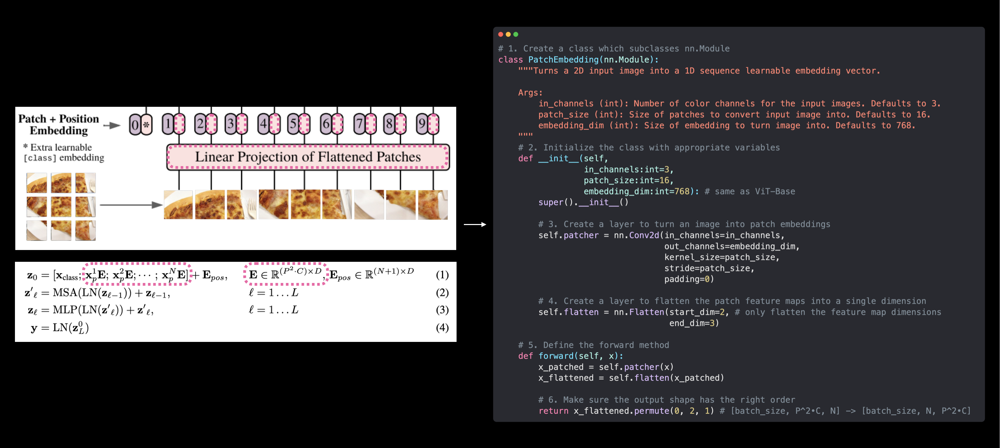


Our PatchEmbedding class (right) replicates the patch embedding of the ViT architecture from Figure 1 and Equation 1 from the ViT paper (left). However, the learnable class embedding and position embeddings haven't been created yet. These will come soon.

Let's now get a summary of our PatchEmbedding layer.


In [ ]:
set_seeds()

# Create an instance of patch embedding layer 
patchify = PatchEmbedding(in_channels=3,
                         patch_size=16,
                         embedding_dim=768)

# Pass a single image through 
print(f"Input image shape: {image.unsqueeze(0).shape}")
print(f"Input image shape: {image.unsqueeze(0)}")
patch_embedded_image = patchify(image.unsqueeze(0)) # add an extra batch dimension 
print(f"Output patch embedding: {patch_embedded_image}")
print(f"Output patch embedding shape: {patch_embedded_image.shape}")

The output shape matches the ideal input and output shapes we'd like to see from the patch embedding layer:

1. Input: The image starts as 2D with size 
H
×
W
×
C
.
2. Output: The image gets converted to a 1D sequence of flattened 2D patches with size 
N
×
(
P
2
⋅
C
)
.
Where:

- (
H
,
W
)
 is the resolution of the original image.
- C
 is the number of channels.
- (
P
,
P
)
 is the resolution of each image patch (patch size).
- N =
H
W
/
P
2
 is the resulting number of patches, which also serves as the effective input sequence length for the Transformer
 
 - 
 

## Let's now get a summary of our PatchEmbedding layer.



In [ ]:
# Create random input sizes
random_input_image = (1, 3, 224, 224)
random_input_image_error = (1, 3, 250, 250) # THis will error as the image size is incomatible with batch size

# Get a summary of the input and outputs of PtacheEmbedding

summary(PatchEmbedding(),
       input_size=random_input_image, # try swapping this for 'random_input_image_error'
       col_names = ["input_size", "output_size", "num_params", "trainable"],
       col_width=20,
       row_settings=['var_names'])

In [ ]:
# summary(PatchEmbedding(),
#        input_size=random_input_image_error, # try swapping this for 'random_input_image_error'
#        col_names = ["input_size", "output_size", "num_params", "trainable"],
#        col_width=20,
#        row_settings=['var_names'])

In [ ]:
random_input_image_error = (1, 3, 256, 256) # THis will error as the image size is incomatible with batch size
summary(PatchEmbedding(),
       input_size=random_input_image_error, # try swapping this for 'random_input_image_error'
       col_names = ["input_size", "output_size", "num_params", "trainable"],
       col_width=20,
       row_settings=['var_names'])

In [ ]:
random_input_image_error = (1, 3, 512, 512) # THis will error as the image size is incomatible with batch size
summary(PatchEmbedding(),
       input_size=random_input_image_error, # try swapping this for 'random_input_image_error'
       col_names = ["input_size", "output_size", "num_params", "trainable"],
       col_width=20,
       row_settings=['var_names'])

In [ ]:
in_shape = (512, 512, 3)
out_shape = ()
P = 16

In [ ]:
N = in_shape[0] * in_shape[1] // P **2 
N , P**2 * in_shape[2] # number of patches 

## 4.6 Creating the class token embedding

After we got our image patch embedding, it is time to get work on the class token embedding ... 

X_class from equation 1...  

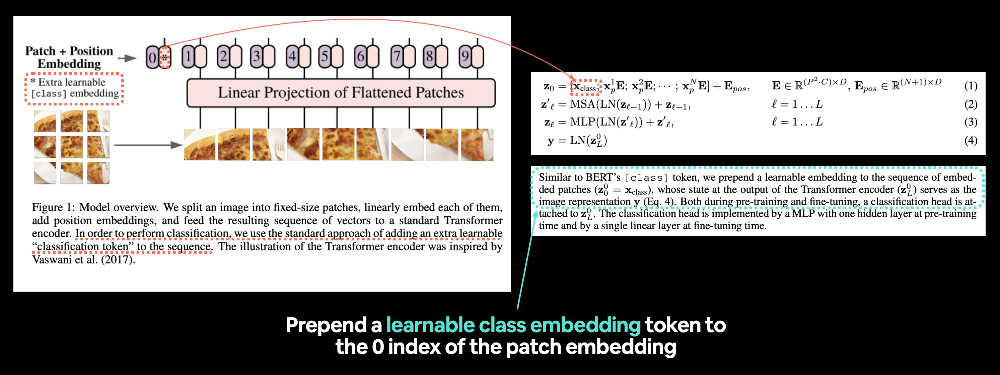


Left: Figure 1 from the ViT paper with the "classification token" or [class] embedding token we're going to recreate highlighted. Right: Equation 1 and section 3.1 of the ViT paper that relate to the learnable class embedding token.

Reading the second paragraph of section 3.1 from the ViT paper, we see the following description:

Similar to BERT's [ class ] token, we prepend a learnable embedding to the sequence of embedded patches 
(
z
0
0
=
x
class 
)
, whose state at the output of the Transformer encoder 
(
z
0
L
)
 serves as the image representation 
y
 (Eq. 4).

Note: BERT (Bidirectional Encoder Representations from Transformers) is one of the original machine learning research papers to use the Transformer architecture to achieve outstanding results on natural language processing (NLP) tasks and is where the idea of having a [ class ] token at the start of a sequence originated, class being a description for the "classification" class the sequence belonged to.

So we need to "preprend a learnable embedding to the sequence of embedded patches".

Let's start by viewing our sequence of embedded patches tensor (created in section 4.5) and its shape

In [ ]:
# View a patch embedding and a patch embedding shape
print(patch_embedded_image)
print(f"Patch embedding shape: {patch_embedded_image.shape} -> [batch_size, number_of_patches, embedding_dimension]")

- To "prepend a learnable embedding to the sequence of embedded patches" we need to create a learnable embedding in the shape of the embedding_dimension (
D
) and then add it to the number_of_patches dimension.

Or in pseudocode:

- patch_embedding = [image_patch_1, image_patch_2, image_patch_3, ......, image_patch_N]
- class_token = learnable_embedding 
- patch_embedding_prepended_to_class_tokern = torch.cat((class_token, patch_embedding), dim=1) # the contactenation happens on the number_of_patches dimension .... 1 --- of the patch_embeddeing = (batch_size, number_of_patches, embed_dim)


Notice the concatenation (torch.cat()) happens on dim=1 (the number_of_patches dimension).

Let's create a learnable embedding for the class token.

To do so, we'll get the batch_size and embedding dimension shape and then we'll create a torch.cat() tensor in the sahpe of [batch_size, 1, embedding_dimension]. 
- And we'll make the tensor learnalbe by passing it to the nn.Parameter() with requires_grad=True

In [ ]:
# Get the batch size and embedding dimension 
batch_size = patch_embedded_image.shape[0]
embedding_dimension = patch_embedded_image.shape[2] # or -1 to grap the last dimension 

# Create the class token embedding as a learnable parameter that shares the same size as the embedding dimension (D)
class_token = nn.Parameter(torch.ones(batch_size, 1, embedding_dimension), # [batch_size, number_of_token, embedding_dimension]
                          requires_grad=True)# make sure the embedding is learnable 


# Show the first 10 examples of class_token
print(class_token[:,:, :10])

In [ ]:
#Print the class_token shape 
print(f"Class token shape: {class_token.shape} -> [batch_size, number_of_tokens, embedding_dimension]")

Note: Here we're only creating the class token embedding as torch.ones() for demonstration purposes, in reality, you'd likely create the class token embedding with torch.randn() (
## since machine learning is all about harnessing the power of controlled randomness, 
you generally start with a random number and improve it over time).

1. See how the number_of_tokens dimension of class_token is 1 since we only want to prepend one class token value to the start of the patch embedding sequence

##### Now we've got the class token embedding, let's prepend it to our sequence of image patches, patch_embedded_image.

2. We can do so using torch.cat() and set dim=1 (so class_token's number_of_tokens dimension is preprended to patch_embedded_image's number_of_patches dimension).

In [ ]:
# View a patch embedding and a patch embedding shape
print(patch_embedded_image)
print(f"Patch embedding shape: {patch_embedded_image.shape} -> [batch_size, number_of_patches, embedding_dimension]")

In [ ]:
# Add the class token embedding to the front of the patch embedding ...
patch_embedded_image_prepended_to_class_token = torch.cat((class_token, patch_embedded_image),
                                                          dim=1) # concatenate on the first dimension (number_patches)


#Print the sequence of patch embeddings with the prepended class token embedding
print(patch_embedded_image_prepended_to_class_token)
print(f"Sequence of patch embeddings with class token prepended shape: {patch_embedded_image_prepended_to_class_token.shape} -> [batch_size, number_of_patches, embedding_dimension]")



Nice! Learnable class token prepended!

Nice! Learnable class token prepended!

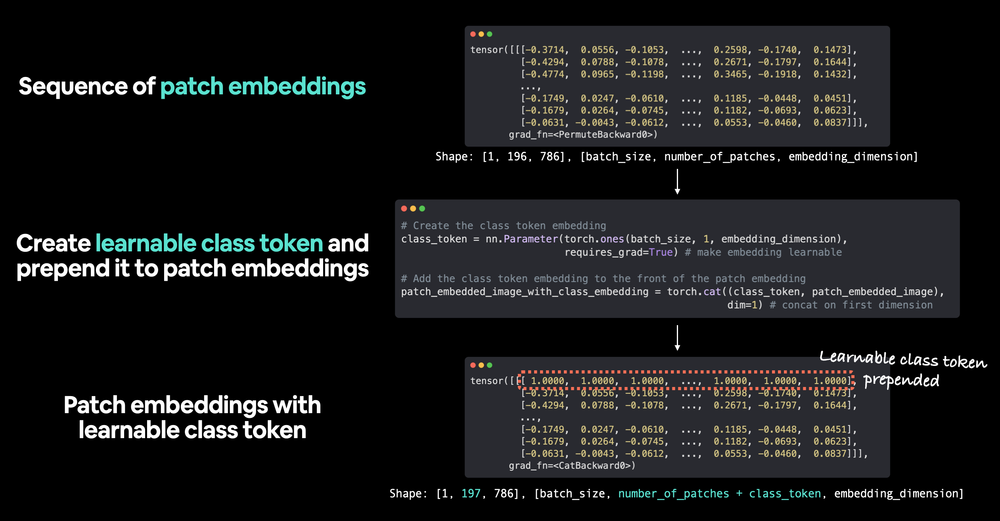



### Reviewing what we've done to create the learnable class token, 
1. we start with a sequence of image patch embeddings created by PatchEmbedding() on single image, 
2. we then created a learnable class token with one value for each of the embedding dimensions 
3. and then prepended it to the original sequence of patch embeddings. 
- Note: Using torch.ones() to create the learnable class token is mostly for demonstration purposes only, in practice, you'd like create it with torch.randn().


## 4.7 Creating the position embedding¶

Well, we've got the class token embedding and the patch embedding, now how might we create the position embedding?

or E_pos from equation 1 where E stands for 'embedding'. 
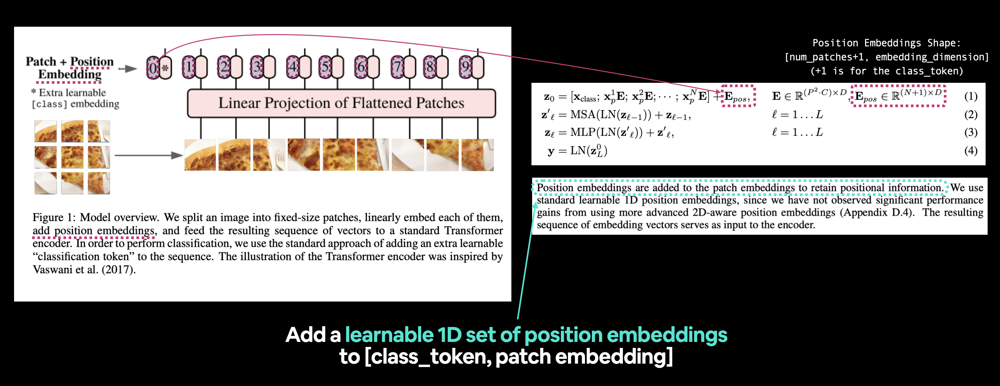


Left: Figure 1 from the ViT paper with the position embedding we're going to recreate highlighted. Right: Equation 1 and section 3.1 of the ViT paper that relate to the position embedding.

Let's find out more by reading section 3.1 of the ViT paper (bold mine):

- Position embeddings are added to the patch embeddings to retain positional information. We use standard learnable 1D position embeddings, since we have not observed significant performance gains from using more advanced 2D-aware position embeddings (Appendix D.4). The resulting sequence of embedding vectors serves as input to the encoder.

- By "retain positional information" the authors mean they want the architecture to know what "order" the patches come in. As in, patch two comes after patch one and patch three comes after patch two and on and on.

- This positional information can be important when considering what's in an image 

# (without positional information an a flattened sequence could be seen as having no order and thus no patch relates to any other patch).

To start creating the position embeddings, let's view our current embeddings.



In [ ]:
#Print the sequence of patch embeddings with the prepended class token embedding
print(patch_embedded_image_prepended_to_class_token)
print(f"Sequence of patch embeddings with class token prepended shape: {patch_embedded_image_prepended_to_class_token.shape} -> [batch_size, number_of_patches, embedding_dimension]")



In equation 1, it states that the position embeddings (E_pos) should have the shape (N+1) * D : 
- E_pos <- R^(N+1) * D

where: 
1. N = HW/P^2 is the resulting number of patches, which also serves as the effective input sequence length for the Transformer (number of patches) 
2. D is the size of the patch embeddings, different values for D can be found in Table 1 (embedding dimension).

Luckily we've got both of these values already... 

So let's make a learnable 1D embedding with torch.ones() to create E_pos. 


In [ ]:
# Calculate N (number of patches)

number_of_patches = int((height * width) / patch_size**2)

# Get embedding dimension 
embedding_dimension = patch_embedded_image_prepended_to_class_token.shape[2]

# Create the learnable 1D position embedding 
position_embedding = nn.Parameter(torch.ones(1,
                                             number_of_patches+1,
                                             embedding_dimension),
                                  requires_grad=True) # Make sure it's learnable 


# Show the first 10 sequences and 10 position embedding values and check the shape of the position embedding
print(position_embedding[:, :10,  :10])
print(position_embedding[:, :,  :])
position_embedding.shape

In [ ]:
print(f"Position embeddding shape: {position_embedding.shape} -> [batch_size, number_of_patches, embedding_dimension]")


Note: Only creating the position embedding as torch.ones() for demonstration purposes, in reality, you'd likely create the position embedding with torch.randn() (start with a random number and improve via gradient descent).

### Position embeddings created!

Let's add them to our sequence of patch embeddings with a prepended class token.

In [ ]:
# add the position embedding to the patch and class token embedding 
patch_and_position_embedding = patch_embedded_image_prepended_to_class_token + position_embedding
print(patch_and_position_embedding)

In [ ]:
print(f"Patch embeddings, class token prepended and positional embeddings added shape: {patch_and_position_embedding.shape} -> [batch_size, number_of_patches, embedding_dimension]")


## Notice how the values of each of the elements in the embedding tensor increases by 1 (this is because of the position embeddings being created with torch.ones()).

- Notice: We could put both the class token embedding and position embedding into their own layer if we wanted to. But we'll see later on in section 8 how they can be incorporated into the overall ViT architectures's forward() method..................

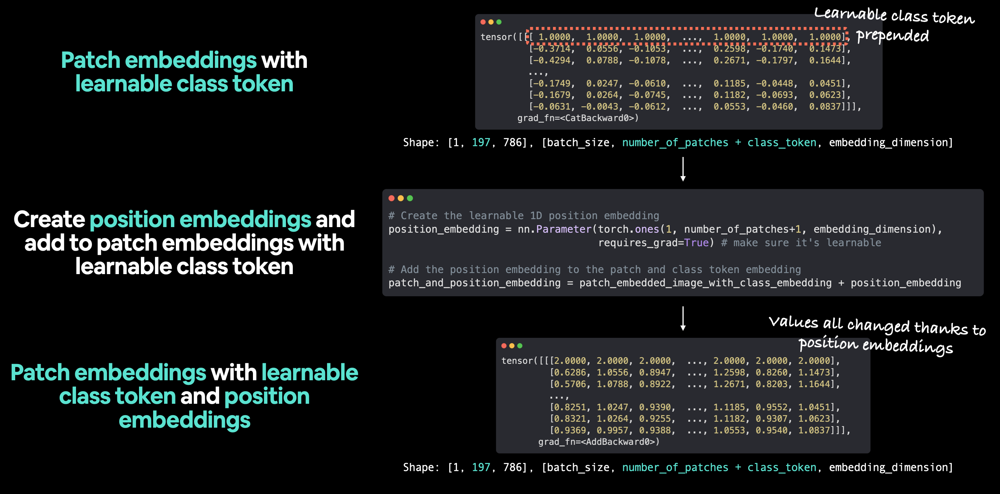


The workflow we've used for adding the position embeddings to the sequence of patch embeddings and class token. Note: torch.ones() only used to create embeddings for illustration purposes, in practice, you'd likely use torch.randn() to start with a random number.

## 4.8 Putting it all together: from image to embedding¶


- Alright, we've come a long way in terms of turning our input images into an embedding and replicating equation 1 from section 3.1 of the ViT paper:
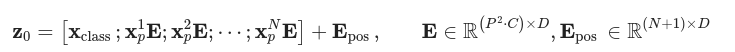


##### Let's now put everything together in a single code cell and go from input image (
x
) to output embedding (
z
0
).


1. Setting the patch size (we'll use 16 as it's widely used throughout the paper and for ViT-base)

2. Getting a single image, priinting its shape and storing its height and width.

3. Adding a batch dimension to the single image so it's compatible with our PatchEmbedding layer.

4. Creating a PatchEmbedding layer with a patch_size=16 and embedding_dim=patch_size^2*C (16^2*3=768)

5. Passing the single image through the PatchEmbedding layer to create a sequence of patch embeddings.

6. Create a class token embedding 

7. Prepending the class token embedding to the patch embeddings (from step 5)

8. Create a position embedding.

9. Adding the position embedding to the class token and patch embeddings (from step 7)

- We'll make sure to set the random seeds with set_seeds() and print out the shapes of different tensors along the way ... 




In [ ]:
# Create a class which is a subclasses nn.Module
class PatchEmbedding(nn.Module):
    """
    Turns a 2D input image into a 1D sequence learnable embedding vector.
    
    Args:
        in_channels (int): Number of color channels for the input images. Defaults to 3.
        patch_size (int): SIze of patches to convert input image into. Default is 16.
        embedding_dim (int): Size of embedding to turn image into. Defaults to 768.
    """
    
    # 2. Initialize the class with appropriate variables 
    def __init__(self,
                 in_channels:int=3,
                 patch_size:int=16,
                 embedding_dim:int=768):
        super().__init__()
        
        #3. Create a layer to turn an image into patches using Conv2d
        self.patcher = nn.Conv2d(in_channels=in_channels,
                                out_channels=embedding_dim,
                                kernel_size=patch_size,
                                stride=patch_size,
                                padding=0)

        #4. Creat a layer to flatten the patch feature maps into a single dimension 
        self.flatten = nn.Flatten(start_dim=2,#only flatten the feature map dimensions into a single vector
                                  end_dim=3
                                 )

    
    # Define the forward method 
    def forward(self, x):
        # Create assertion to check that inputs are the correct shape ... 
        image_resolution = x.shape[-1]
        assert image_resolution % patch_size == 0, f"Input image size must be divisble by patch size, image shape : {image_resolution}, patch size: {patch_size}"
        
        
        # Perform the forward pass 
        x_patched = self.patcher(x)
        x_flattened = self.flatten(x_patched)
        
        return x_flattened.permute(0, 2, 1) # adjust so the embedding is on teh final dimension [batch_size, P^2*C, N] -> [batch_size, N, P^2*C]

In [ ]:
set_seeds()

# 1. Set patch size
patch_size = 16

# 2. Print shape of original image tensor and get the image dimension 
print(f"Image tensor shape: {image.shape}")
C, height, width = image.shape[0], image.shape[1], image.shape[2]
number_of_patches = int((height*width)/patch_size**2)
embedding_dim = patch_size**2 * C

# 3. Get image tensor and add batch dimension 
x = image.unsqueeze(0) 
print(f"Input image with batch dimension shape: {x.shape}")


# 4. Create a PatchEmbedding layer 
patch_embedding_layer = PatchEmbedding(in_channels=3,
                                      patch_size=patch_size,
                                      embedding_dim=embedding_dim )

# 5. Pass image through patch embedding layer
patch_embedding = patch_embedding_layer(x)
print(f"Patching embedding shape: {patch_embedding.shape}")

# 6. Create class token embedding 
patch_size = patch_embedding.shape[0]
embedding_dimension = patch_embedding.shape[-1]
class_token = nn.Parameter(torch.ones(batch_size,
                                     1,
                                     embedding_dimension),
                          requires_grad=True)# To make sure the token class is learnable....
print(f"Class token embedding shape: {class_token.shape}")

# 7. Prepend class token embedding to patch embedding 
patch_embedding_class_token = torch.cat((class_token,
                                        patch_embedding),
                                       dim=1)
print(f"Patch embedding with class token shape: {patch_embedding_class_token.shape}")


# 8. Create position embedding
position_embedding = nn.Parameter(torch.ones(1,
                                            number_of_patches+1,
                                            embedding_dimension),
                                 requires_grad=True)


# 9. Add position embedding to patch embedding with class token
patch_and_position_embedding = patch_embedding_class_token + position_embedding
print(f"Patch and position embedding shape: {patch_and_position_embedding.shape}")

                                       
                                       
                                    

From a single image to patch and position embeddings in a single cell of code.

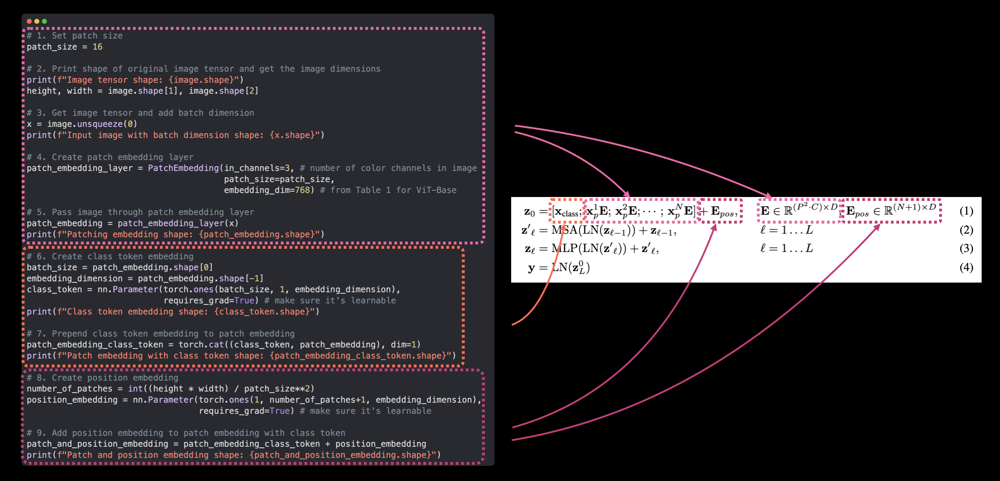

Mapping equation 1 from the ViT paper to our PyTorch code. This is the essence of paper replicating, taking a research paper and turning it into usable code.

Now we've got a way to encode our images and pass them to the Transformer Encoder in Figure 1 of the ViT paper.

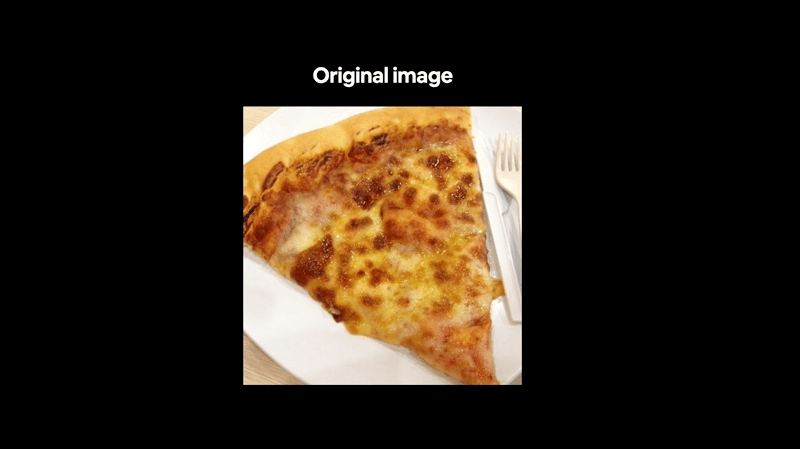

Animating the entire ViT workflow: from patch embeddings to transformer encoder to MLP head.

From a code perspective, creating the patch embedding is probably the largest section of replicating the ViT paper.

Many of the other parts of the ViT paper such as the Multi-Head Attention and Norm layers can be created using existing PyTorch layers.

### Onwards!

# 5. Equation 2: Multi-Head Attention (MSA)¶

1. We've got our input data patchified and embedded, now let's move onto the next part of the ViT architecture.
2. To start, we'll break down the Transformer Encoder section into two parts (start small and increase when necessary).

- The first being equation 2 and the second being equation 3.

- Recall equation 2 states:
    - 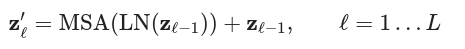
    - This indicates a Multi-Head Attention (MSA) layer wrapped in a LayerNorm (LN) layer with a residual connection  
    -(the input to the layer gets added to the output of the layer).
    
3. We'll refer to equation 2 as the "MSA block".
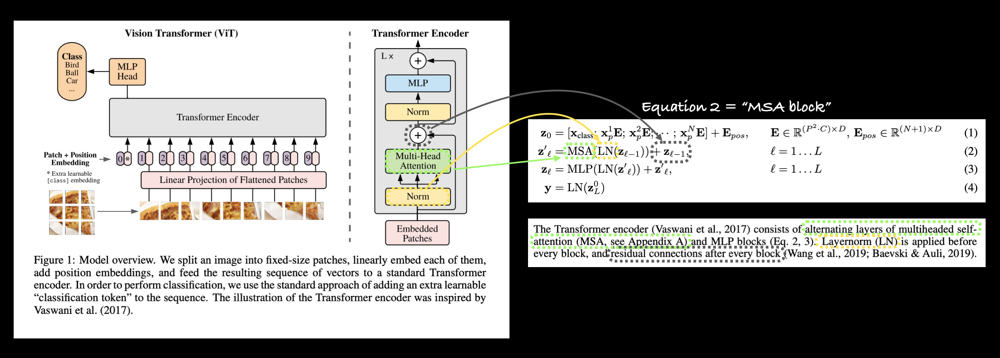


- *Left: Figure 1 from the ViT paper with Multi-Head Attention and Norm layers as well as the residual connection (+) highlighted within the Transformer Encoder block. Right: Mapping the Multi-Head Self Attention (MSA) layer, Norm layer and residual connection to their respective parts of equation 2 in the ViT paper.*


- Many layers you find in research papers are already implemented in modern deep learning frameworks such as PyTorch.

#### In saying this, to replicate these layers and residual connection with PyTorch code we can use:

1. Multi-Head Self Attention (MSA) - torch.nn.MultiheadAttention()
2. Norm (LN or LayerNorm) - torch.nn.LayerNorm()
3. Residual connection - add the input to output (we'll use it to create the full Transformer Encoder block ) ..

## 5.1 The LayerNorm (LN) layer 

- Layer Normalization (torch.nn.LayerNorm() or Norm or LayerNorm or LN) normalizes an input over the last dimension .
- 
 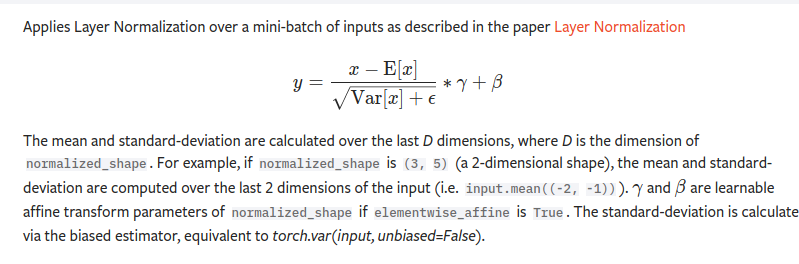
 
 - PyTorch's torch.nn.LayerNorm()'s main parameter is normalized_shape which we can set to be equal to the dimension size we'd like to noramlize over (in our case it'll be 
D
 or 768 for ViT-Base).

### What does it do?
1. Layer Normalization helps improve training time and model generalization (ability to adapt to unseen data).
2. I like to think of any kind of normalization as "getting the data into a similar format" or "getting data samples into a similar distribution".
3. Imagine trying to walk up (or down) a set of stairs all with differing heights and lengths.
####  It'd take some adjustment on each step right?
- And what you learn for each step wouldn't necessary help with the next one since they all differ, increasing the time it takes you to navigate the stairs.

- Therefore, Normalization (including Layer Normalization) is the equivalent of making all the stairs the same height and length except the stairs are your data samples.

- So just like you can walk up (or down) stairs with similar heights and lengths much easier than those with unequal heights and widths, neural networks can optimize over data samples with similar distributions (similar mean and standard-deviations) easier than those with varying distributions.

## 5.2 The Multi-Head Self Attention (MSA) layer¶

- The power of the self-attention and multi-head attention (self-attention applied multiple times) were revealed in the form of the original Transformer architecture introduced in the Attention is all you need research paper.

- Originally designed for text inputs, the original self-attention mechanism takes a sequence of words and then calculates which word should pay more "attention" to another word.


- In other words, in the sentence "the dog jumped over the fence", perhaps the word "dog" relates strongly to "jumped" and "fence".

- This is simplified but the premise remains for images.

- Since our input is a sequence of image patches rather than words, self-attention and in turn multi-head attention will calculate which patch of an image is most related to another patch, eventually forming a learned representation of an image.

###### But what's most important is that the layer does this on it's own given the data (we don't tell it what patterns to learn).

### And if the learned representation the layers form using MSA are good, we'll see the results in our model's performance.

- There are many resources online to learn more about the Transformer architeture and attention mechanism online such as Jay Alammar's wonderful Illustrated Transformer post and Illustrated Attention post.

- We're going to focus more on coding an existing PyTorch MSA implementation than creating our own.


- However, you can find the formal defintion of the ViT paper's MSA implementation is defined in Appendix A:

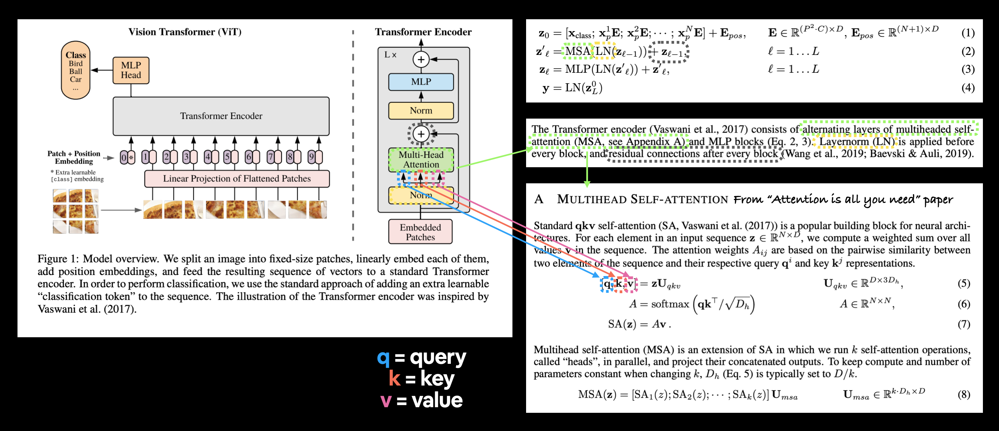

*Left: Vision Transformer architecture overview from Figure 1 of the ViT paper. Right: Definitions of equation 2, section 3.1 and Appendix A of the ViT paper highlighted to reflect their respective parts in Figure 1.*

#### The image above highlights the triple embedding input to the MSA layer.


1. This is known as query, key, value input or qkv for short which is fundamental to the self-attention mechanism.

### In our case, the triple embedding input will be three versions of the output of the Norm layer, one for query, key and value.



2. Or three versions of our layer-normalized image patch and position embeddings created in section 4.8.

### We can implement the MSA layer in PyTorch with torch.nn.MultiheadAttention() with the parameters:
1. embed_dim - the embedding dimension (hidden size D -> [patch_size**2 * C]
2. num_heads - how many attention heads to use (this is where the term "Multihead" comes from ), this value is also equal to 8 accroding the ViT paper in Table 1.
3. dropout - whether or not to apply dropout to the attention layer (according to Appendix B.1, dropout isn't used after the qkv-projections).
4. batch_first - does our batch dimension come first?? (yes it does).


## Replicating Equation 2 with PyTorch layers 

Let's put everything we've discussed about the LayerNorm (LN) and Multi-Head Attention (MSA) layers in equation 2 into practice.

- To do so, we'll:

1. Create a class called MultiheadSelfAttentionBlock that inherits from torch.nn.Module.
2. Initialize the class with hyperparameters from Table 1 of the ViT paper for the ViT-Base model.
3. Create a layer normalization (LN) layer with torch.nn.LayerNorm() with the normalized_shape parameter the same as our embedding dimension (D from Table 1 in ViT paper)
4. Create a Multihead attention (MSA) layer with the approperate embed_dim, num_heads, dropout and batch_first parameters.
5. Create a forward() method for our class passing the inputs through the LN layer and MSA layer.


In [ ]:
# 1. Create a class the inherits from nn.Module
class MultiheadSelfAttentionBlock(nn.Module):
    """
    Creates a multi-head self-attention block (MSA block for short)
    """
    #2. Initialize the class with hyperparameters from Table 1 in ViT paper
    def __init__(self,
                embedding_dim:int=768, # Hidden size D from T1 of ViT-Base
                num_heads:int=12,
                attn_dropout:int=0 # doesn't look like the paper uses any dropout in MSABlocks
                ):
        super().__init__()
        
        # 3. Create the Norm Layer (NL)
        self.layer_norm = nn.LayerNorm(normalized_shape=embedding_dim)
        
        # 4. Create the Multi-Head Attention (MSA) layer 
        self.multihead_attn = nn.MultiheadAttention(embed_dim=embedding_dim,
                                                   num_heads=num_heads,
                                                   dropout=attn_dropout,
                                                   batch_first=True)
        
    # 5. Create a forward() method to pass the data through the layers

    def forward(self, x):
        x = self.layer_norm(x)
        attn_output, _ = self.multihead_attn(query=x,# query embeddings
                                            key=x, # key embeddings
                                            value=x, # value embeddings
                                            need_weights=False) # Do we need we need the weights or just layer output

        return attn_output

- Note: Unlike Figure 1, our MultiheadSelfAttentionBlock doesn't include a skip or residual connection ("
+
z
ℓ
−
1
" in equation 2), we'll include this when we create the entire Transformer Encoder later on in section 7.1.

MSABlock created!

Let's try it out by create an instance of our MultiheadSelfAttentionBlock and passing through the patch_and_position_embedding variable we created in section 4.8.

In [ ]:
C, height, width = image.shape[0], image.shape[1], image.shape[2]
number_of_patches = int((height*width)/patch_size**2)
patch_size = 16
embedding_dim = patch_size**2 * C
num_heads = 12 # from Table 1 in ViT paper
embedding_dim, patch_size**2 * C, C, patch_size

In [ ]:
# Create an instance of MSABlock
multihead_self_attention_block = MultiheadSelfAttentionBlock(embedding_dim=embedding_dim,
                                                              num_heads = num_heads)
    
    
# Pass patch and position image embedding through MSABlock
patched_image_through_msa_block = multihead_self_attention_block(patch_and_position_embedding)
print(f"Input shape of MSA block: {patch_and_position_embedding.shape}")
print(f"Output shape MSA block: {patched_image_through_msa_block.shape}")

    

## Notice how the input and output shape of our data stays the same when it goes through the MSA block.

### This doesn't mean the data doesn't change as it goes through.


#### You could try printing the input and output tensor to see how it changes (though this change will be across 1 * 197 * 768 values and could be hard to visualize).

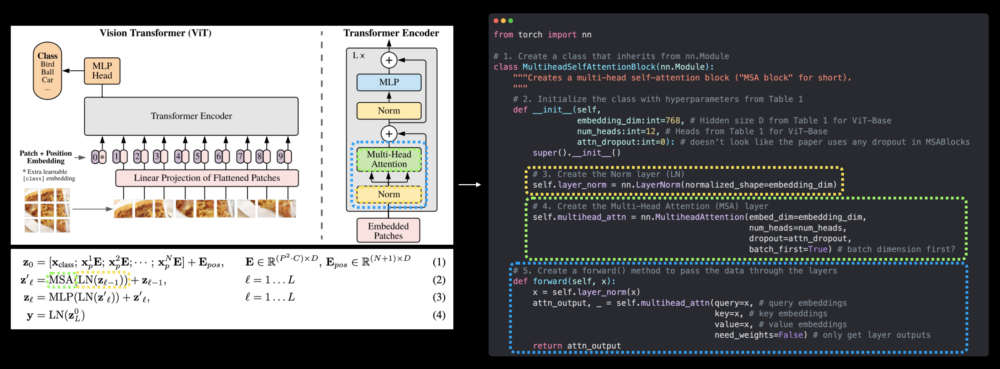


*Left: Vision Transformer architecture from Figure 1 with Multi-Head Attention and LayerNorm layers highlighted, these layers make up equation 2 from section 3.1 of the paper. Right: Replicating equation 2 (without the skip connection on the end) using PyTorch layers.*

We've now officially replicated equation 2 (except for the residual connection on the end but we'll get to this in section 7.1)!

Onto the next!



# 6. Equation 3: Multilayer Perceptron (MLP)¶

We're in a roll here!
Let's keep it going and replicate equation 3:

  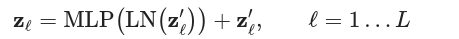
  
  
  - Here MLP stands for "multilayer perceptron" and LN stands for "layer normalization" (as discussed above).

   - And the addition on the end is the skip/residual connection.
   
- We'll refer to equation 3 as the "MLP block" of the Transformer encoder (notice how we're continuing the trend of breaking down the architecture into smaller chunks).

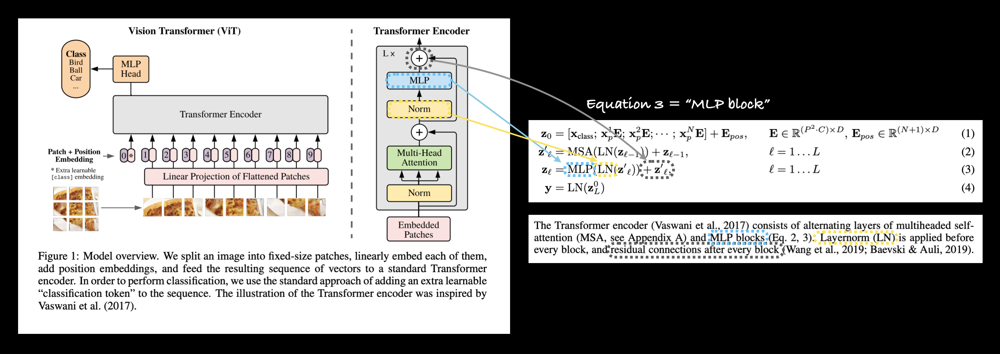

*Left: Figure 1 from the ViT paper with MLP and Norm layers as well as the residual connection (+) highlighted within the Transformer Encoder block. Right: Mapping the multilayer perceptron (MLP) layer, Norm layer (LN) and residual connection to their respective parts of equation 3 in the ViT paper.*


## 6.1 The MLP layer(s)¶

  1. The term MLP is quite broad as it can refer to almost any combination of multiple layers (hence the "multi" in multilayer perceptron).

2. But it generally follows the pattern of: linear layer -> non-linear layer -> linear layer -> non-linear layer

3. In the the case of the ViT paper, the MLP structure is defined in section 3.1: The MLP contains two layers with a GELU non-linearity.

4. Where "two layers" refers to linear layers (torch.nn.Linear() in PyTorch) and "GELU non-linearity" is the GELU (Gaussian Error Linear Units) non-linear activation function (torch.nn.GELU() in PyTorch).

5. Table 3 summarizes our training setups for our different models. ...Dropout, when used, is applied after every dense layer except for the the qkv-projections and directly after adding positional- to patch embeddings.
    - This means that every linear layer (or dense layer) in the MLP block has a dropout layer (torch.nn.Dropout() in PyTorch).
    - The value of which can be found in Table 3 of the ViT paper (for ViT-Base, dropout=0.1).
    
    - Knowing this, the structure of our MLP block will be: layer norm -> linear layer -> non-linear layer -> dropout -> linear layer -> dropout
    
    - With hyperparameter values for the linear layers available from Table 1 (MLP size is the number of hidden units between the linear layers and hidden size D  is the output size of the MLP block).
    
    

## 6.2 Replicating Equation 3 with PyTorch layers¶

- Let's put everything we've discussed about the LayerNorm (LN) and MLP (MSA) layers in equation 3 into practice.

1. Create a class called MLPBlock that inherits from torch.nn.Module.
2. Initialize the class with hyperparameters from Table 1 and Table 3 of the ViT paper for the ViT-Base model.
3. Create a layer normalizaiton (LN) layer with torch.nn.LayerNorm() with the normalized_shape parameters the same as our embedding dimension (D from T1)
4. Create a sequential series of MLP layers(s) using torch.nn.Linear(), torch.nn.Dropout(), and torch.nn.GELU() with approperiate hyperparmeter values from T1 in ViT-Base model.
5. Create a forward() method for our class passing the inputs through the LN layer and MLP layer(s).



In [ ]:
# 1. Create a class that inherits from nn.Module
class MLPBlock(nn.Module):
    """
    Creates a layer normalized multilayer perceptron block (MLP Block for short)
    """
    # 2. Initialilze the class with hyperparmeters from T1 and T3
    def __init__(self,
                embedding_dim:int=768, # Hidden Size D from T1 for ViTBase model
                mlp_size:int=3072, # MLP size from T1 for ViT-Base hidden units
                dropout:int=0): # Dropout from T3 for ViT-Base model
        super().__init__()
        
        # 3. Create the Norm layer (LN)
        self.layer_norm = nn.LayerNorm(normalized_shape=embedding_dim)
        
        # 4. Create the Multilayer perceptron (MLP) layers 
        self.mlp = nn.Sequential(
        nn.Linear(in_features=embedding_dim,
                 out_features=mlp_size),
            
        nn.GELU(), # The MLP contains two layers with a GELU non-linearity (Gaussian Error Linear Unit)
        nn.Dropout(p=dropout),
        nn.Linear(in_features=mlp_size, # nedds to take the same in_features as out_features of the prev. layer
                 out_features=embedding_dim), # take back to embedding_dim
        nn.Dropout(p=dropout) # Dropout, when used, is applied after every dense layer
        )
        
    # 5. Create a forward() method to pass teh data through the layers
    def forward(self, x):
        x = self.layer_norm(x)
        x = self.mlp(x)
        return x
    

- Note: Unlike Figure 1, our MLPBlock() doesn't include a skip or residual connection ("
+
z
′
ℓ
" in equation 3), we'll include this when we create the entire Transformer encoder later on.

MLPBlock class created!

Let's try it out by create an instance of our MLPBlock and passing through the patched_image_through_msa_block variable we created in section 5.3.

In [ ]:
C, height, width = image.shape[0], image.shape[1], image.shape[2]
number_of_patches = int((height*width)/patch_size**2)
patch_size = 16
mlp_size = 3072 # From T1 
dropout = 0.1 # From T3
embedding_dim = patch_size**2 * C
num_heads = 12 # from Table 1 in ViT paper
embedding_dim, patch_size**2 * C, C, patch_size

In [ ]:
# Create an instance of MLPBlock
mlp_block = MLPBlock(embedding_dim=embedding_dim,
                    mlp_size = mlp_size,
                    dropout=dropout)

In [ ]:
# Pass output of MSABlock through MLPBlock
patched_image_through_mlp_block = mlp_block(patched_image_through_msa_block)
print(f"Input shape of MLP block: {patched_image_through_msa_block.shape}")
print(f"Output shape MLP block: {patched_image_through_mlp_block.shape}")

- Notice how the input and output shape of our data again stays the same when it goes in and out of the MLP block.

1. However, the shape does change when the data gets passed through the nn.Linear() layers within the MLP block (expanded to MLP size from Table 1 
2. and then compressed back to Hidden size D from Table 1).
 
 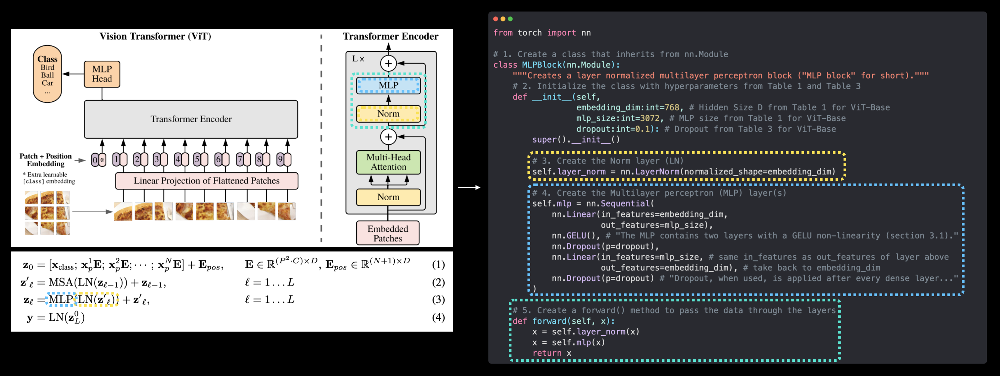
 
 Left: Vision Transformer architecture from Figure 1 with MLP and Norm layers highlighted, these layers make up equation 3 from section 3.1 of the paper. Right: Replicating equation 3 (without the skip connection on the end) using PyTorch layers.
 
 
 - Equation 3 replicated (except for the residual connection on the end but we'll get to this in section 7.1)!

Now we've got equation's 2 and 3 in PyTorch code, let's now put them together to create the Transformer Encoder.
 

# 7. Create the Transformer Encoder¶

Time to stack together our MultiheadSelfAttentionBlock (eq 2) and MLPBlock (eq 3) and create the Transformer Encoder of the ViT architecture ...

1. In deep learning, an encoder or autoencoder generally refers to a stack of layers that encodes an input (turns it into some form of numberical representation). 

2. In our case, the Transformer Encoder will encode our patched image embedding into a learnable representation usining a series of alternation layers of MSA blocks and MLP blocks, as per section 3.1 fo the ViT paper.

### The Transformer encoder (Vaswani et al., 2017) consists of alternating layers  of multiheaded selfattention (MSA, Appendix A) and MLP blocks (Eq. 2, 3). Layernorm (LN) is applied before every block, and residual connections after every block (Wang et al., 2019; Baveski & Auli, 2019). 

3. Residual connections (also called skip connections), were first introduced in the paper Deep Residual Learning fro Image Recognitionan dare achieved by adding a layer(s) input to its subsequent output.
    - A subsequent output might be one or more layers later.
4. In the case of the ViT architecture, the residual connection means 
    - the input of the MSA block is added back to the output of the MSA block before it passes to the MLP block.
    - And the same thing happens with the MLP block before it goes onto the next Transformer Encoder block.
    
5. Skip connection (residual conection) in pseudocode:
    - x_input -> MSA_block -> [MSA_block_output + x_input] -> MLP_block -> [MLP_block_output + MSA_block_output + x_input] -> ...
    
    
### What does this do??
- One of the main ideas behind residual connections is that they prevent weight values and gradient updates from getting too small and thus allow deeper networks and in turn allow deepre representations to be learned....

6. Note: the iconic computer vision architecture "ResNet" is named so because of the introduction of residual connections. You can fnd many pretrained versions of ResNet architecture in torchvision.models...






## 7.1 Creating a Transformer Encoder by combining our custom made layers¶
- Enough talk, let's see this in action and make a ViT Transformer Encoder with PyTorch by combining our previously created layers.


1. Create a class called TransformerEncoderBlock that inherits from torch.nn.Module.
2. Initialize the class with hyperparameters from T1, T2 in ViT-Base model.
3. Instantiate a MSA block for equation 2 using our MultiheadSelfAttentionBlock from section 5.2 with the approperiate parameters.
4. Instantiate a MLP block for equation 3 using our MLPBlock from section 6.2 with the appropriate parameters.
5. Create a forwrd() method for our TransformerEncoderBlock class
6. Create a residual connection for the MSA block (for Eq 2).
7. Create a residual connection for the MLP block (for Eq. 3). 



In [ ]:
# Create a class that inherits from nn.Module
class TransformerEncoderBlock(nn.Module):
    """
    Create a Transformer Encoder Block.
    """
    # 1. Initialize the class with the hyperparameters from T1 and T3
    def __init__(self,
                embedding:int=768, # Hidden Size D from T1 for ViT-Base model
                num_heads:int=12, # Heads from T1 
                mlp_size:int=3072, # MLP size from T1
                mlp_dropout:int=0.1, # Amount of dropout fro dense layers from T3 for ViT-Base model
                attn_dropout:int=0): # Amount of dropout for attention layers
        super().__init__()
        
        # 3. Create MSA block (Eq. 2)
        self.msa_block = MultiheadSelfAttentionBlock(embedding_dim=embedding_dim,
                                                    num_heads=num_heads,
                                                    attn_dropout=attn_dropout)
        
        # 4. Create a MLP block (Eq. 3)
        self.mlp_block = MLPBlock(embedding_dim=embedding_dim,
                                 mlp_size=mlp_size,
                                 dropout=mlp_dropout)
        
        
        
    # 5. Create a forward() method 
    def forward(self, x):
        # 6. Create residual connection for MSA block (add the input to the output)
        x = self.msa_block(x) + x
        
        # 7. Create residual connection fro MLP block (add the input to the output)
        x = self.mlp_block(x) + x
        
        return x
                
            

#### Transformer Encoder block created!

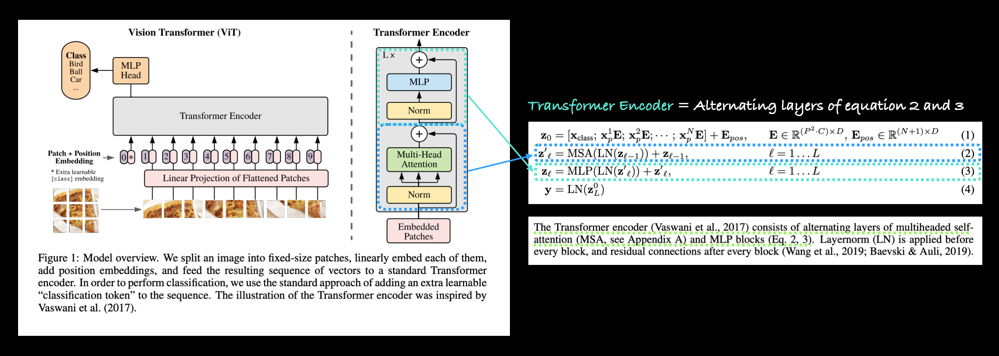

- *Left: Figure 1 from the ViT paper with the Transformer Encoder of the ViT architecture highlighted. Right: Transformer Encoder mapped to equation 2 and 3 of the ViT paper, the Transformer Encoder is comprised of alternating blocks of equation 2 (Multi-Head Attention) and equation 3 (Multilayer perceptron).*

- See how we're starting to piece together the overall architecture like legos, coding one brick (or equation) at a time.

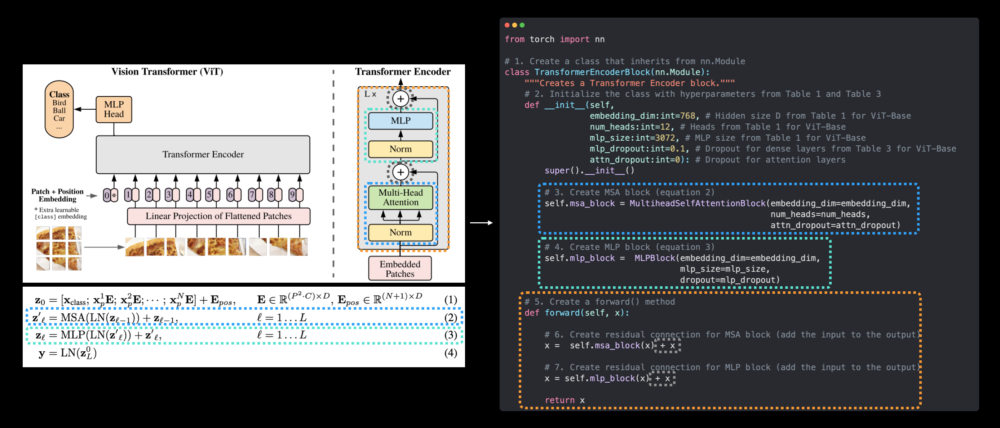

- Mapping the ViT Transformer Encoder to code.

1. You might've noticed that Table 1 from the ViT paper has a Layers column. This refers to the number of Transformer Encoder blocks in the specific ViT architecure.

2. In our case, for ViT-Base, we'll be stacking together 12 of these Transformer Encoder blocks to form the backbone of our architecture (we'll get to this in section 8).

- Let's get a torchinfo.summary() of passing an input of shape (1, 197, 768) -> (batch_size, num_patches, embedding_dimension) to our Transformer Encoder block.

In [ ]:
# Create an instance of TransformerEncoderBlock 
transformer_encoder_block = TransformerEncoderBlock()

In [ ]:
# print out an input and output summary of our Transformer Encoder 
summary(model=transformer_encoder_block,
       input_size=(1, 197, 768), # (batch_size, num_patches, embedding_dimension)
        col_names = ["input_size", "output_size", "num_params", "trainable"],
        col_width=14,
        row_settings=["var_names"]
                  )

- Woah! Check out all those parameters!

- You can see our input changing shape as it moves through all of the various layers in the MSA block and MLP block of the Transformer Encoder block before finally returning to its original shape at the very end.

### Note: Just because our input to the Transformer Encoder block has the same shape at the output of the block doesn't mean the values weren't manipulated, the whole goal of the Transformer Encoder block (and stacking them together) is to learn a deep representation of the input using the various layers in between.


## 7.2 Creating a Transformer Encoder with PyTorch's Transformer layers¶

- So far we've built the components of and the Transformer Encoder layer itself ourselves.

# But because of their rise in popularity and effectiveness, PyTorch now has in-built Transformer layers as part of torch.nn.


1. For example, we can recreate the TransformerEncoderBlock we just created using torch.nn.TransformerEncoderLayer() and setting the same hyperparameters as above.



In [ ]:
# Create the same as above with torch.nn.TransformerEncoderLayer()

torch_transformer_encoder_layer = nn.TransformerEncoderLayer(d_model= 768, # Hidden size D from T1
                                                             nhead=12, # Heads from T3
                                                             dim_feedforward=3072, # MLP size from T1
                                                             dropout=0.1, # Amount of dropout for dense layers from T3
                                                             activation="gelu", # Gaussian Error Linear Unit GELU non linear activation 
                                                             batch_first=True, # batches come first
                                                             norm_first=True # Normalize first or after MSA/MLP layers
                                                            )

In [ ]:
torch_transformer_encoder_layer

In [ ]:
# To inspect it further, let's get a summary with torchinfo.summary().

summary(model=torch_transformer_encoder_layer,
        input_size=(1, 197, 768), # (batch_size, num_patches, embedding_dimension)
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=14,
        row_settings=["var_names"])

1. The output of the summary is slightly different to ours due to how torch.nn.TransformerEncoderLayer() constructs its layer.

2. But the layers it uses, number of parameters and input and output shapes are the same.

3. You might be thinking, "if we could create the Transformer Encoder so quickly with PyTorch layers, why did we bother reproducing equation 2 and 3?"
    - The answer is: practice.
    - Now we've replicated a series of equations and layers from a paper, if you need to change the layers and try something different you can.
    

#### But there are benefits of using the PyTorch pre-built layers, such as:

1. Less prone to errors - Generally, if a layer makes it into the PyTorch standard library, its been tested and tried to work.

2. Potentially better performance - As of July 2022 and PyTorch 1.12, the PyTorch implemented version of torch.nn.TransformerEncoderLayer() can see a speedup of more than 2x on many common workloads.

3. Finally, since the ViT architecture uses several Transformer Layers stacked on top of each for the full architecture (Table 1 shows 12 Layers in the case of ViT-Base), you can do this with torch.nn.TransformerEncoder(encoder_layer, num_layers) where:

    - encoder_layer - The target Transformer Encoder layer created with torch.nn.TransformerEncoderLayer()
    - num_layers - The number of Transformer Encoder layers to stack together 



In [ ]:
a = torch.arange(1, 5)
a

In [ ]:
a.view(1, -1)

In [ ]:
a.view(-1, 1)

In [ ]:
x = torch.arange(6)

print(x.view(3, -1))      # inferred size will be 2 as 6 / 3 = 2
print(x.view(-1, 6))      # inferred size will be 1 as 6 / 6 = 1
print(x.view(1, -1, 2))   # inferred size will be 3 as 6 / (1 * 2) = 3
#print(x.view(-1, -1, 3))  # throw error as only one dimension can be inferred

# 8. Putting it all together to create ViT¶

- It's time to do the exciting thing of putting together all of the piece of the puzzle. 
- We're going to combine all of the blocks we've created to replicate the full ViT architectur
- From the patch and positional embedding to the Transformer Encoder(s) to the MLP Head.
        - But wait, we haven't created equation 4 yet... y = LN(Z_L^0)
        
- Don't worry, we can put equation 4 into our overall ViT architecture class.


1. All we need is a torch.nn.LayerNorm() layer and a torch.nn.Linear() layer to convert the 0th index ($\mathbf{z}_{L}^{0}$) of the Transformer Encoder logit outputs to the target number of classes we have.

2. To create the full architecture, we'll also need to stack a number of our TransformerEncoderBlocks on top of each other, we can do this by passing a list of them to torch.nn.Sequential() (this will make a sequential range of TransformerEncoderBlocks).

3. We'll focus on the ViT-Base hyperparameters from Table 1 but our code should be adaptable to other ViT variants.


4. We'll focus on the ViT-Base hyperparameters from Table 1 but our code should be adaptable to other ViT variants.

5. Creating ViT will be our biggest code block yet but we can do it!

#### Finally, to bring our own implementation of ViT to life, let's:

1. Create a class called ViT that inherits from torch.nn.Module
2. Initialize the class with hyperparameters from T1 and T3 of the ViT paper for the ViT-Base model.
3. Make sure the image size is divisible by the Patch size ( the image should be split into even patches).
4. Calculate the number of patches using the formula $N=H * W / P^{2}$, where $H$ is the image height, $W$ is the image width and $P$ is the patch size.
5. Create a learnable class embedding token (Eq 1)
6. Create a learnable position embedding vector (Eq 1)
7. Setup the embedding dropout layer.
8. Create the patch embedding layer using the PatchEmbedding class.
9. Create a series of Transformer Encoder blocks by passing a list of TransformerEncoderBlocks created in section 7.1 to torch.nn.Sequential() (equations 2 & 3).
10. Create the MLP head (also called classifier head or equation 4) by passing a torch.nn.LayerNorm() (LN) layer and a torch.nn.Linear(out_features=num_classes) layer (where num_classes is the target number of classes) linear layer to torch.nn.Sequential().
11. Create a forward() method that accepts an input.
12. Get the batch size of the input (the first dimension of the shape).
13. Create the patching embedding using the layer created in step 8 (equation 1).
14. Create the class token embedding using the layer created in step 5 and expand it across the number of batches found in step 11 using torch.Tensor.expand() (equation 1).
15. Concatenate the class token embedding created in step 14 to the first dimension of the patch embedding created in step 13 using torch.cat() (equation 1).
16. Add the position embedding created in step 6 to the patch and class token embedding created in step 15 (equation 1).
17. Pass the patch and position embedding through the dropout layer created in step 7.
18. Pass the patch and position embedding from step 16 through the stack of Transformer Encoder layers created in step 9 (equations 2 & 3).
19. Pass index 0 of the output of the stack of Transformer Encoder layers from step 17 through the classifier head created in step 10 (equation 4).
- Dance and shout woohoo!!! We just built a Vision Transformer!








            




In [9]:
# 1. Create a class that inherits from nn.Module
class MLPBlock(nn.Module):
    """
    Creates a layer normalized multilayer perceptron block (MLP Block for short)
    """
    # 2. Initialilze the class with hyperparmeters from T1 and T3
    def __init__(self,
                embedding_dim:int=768, # Hidden Size D from T1 for ViTBase model
                mlp_size:int=3072, # MLP size from T1 for ViT-Base hidden units
                dropout:int=0): # Dropout from T3 for ViT-Base model
        super().__init__()
        
        # 3. Create the Norm layer (LN)
        self.layer_norm = nn.LayerNorm(normalized_shape=embedding_dim)
        
        # 4. Create the Multilayer perceptron (MLP) layers 
        self.mlp = nn.Sequential(
        nn.Linear(in_features=embedding_dim,
                 out_features=mlp_size),
            
        nn.GELU(), # The MLP contains two layers with a GELU non-linearity (Gaussian Error Linear Unit)
        nn.Dropout(p=dropout),
        nn.Linear(in_features=mlp_size, # nedds to take the same in_features as out_features of the prev. layer
                 out_features=embedding_dim), # take back to embedding_dim
        nn.Dropout(p=dropout) # Dropout, when used, is applied after every dense layer
        )
        
    # 5. Create a forward() method to pass teh data through the layers
    def forward(self, x):
        x = self.layer_norm(x)
        x = self.mlp(x)
        return x
    

In [10]:
# 1. Create a class the inherits from nn.Module
class MultiheadSelfAttentionBlock(nn.Module):
    """
    Creates a multi-head self-attention block (MSA block for short)
    """
    #2. Initialize the class with hyperparameters from Table 1 in ViT paper
    def __init__(self,
                embedding_dim:int=768, # Hidden size D from T1 of ViT-Base
                num_heads:int=12,
                attn_dropout:int=0 # doesn't look like the paper uses any dropout in MSABlocks
                ):
        super().__init__()
        
        # 3. Create the Norm Layer (NL)
        self.layer_norm = nn.LayerNorm(normalized_shape=embedding_dim)
        
        # 4. Create the Multi-Head Attention (MSA) layer 
        self.multihead_attn = nn.MultiheadAttention(embed_dim=embedding_dim,
                                                   num_heads=num_heads,
                                                   dropout=attn_dropout,
                                                   batch_first=True)
        
    # 5. Create a forward() method to pass the data through the layers

    def forward(self, x):
        x = self.layer_norm(x)
        attn_output, _ = self.multihead_attn(query=x,# query embeddings
                                            key=x, # key embeddings
                                            value=x, # value embeddings
                                            need_weights=False) # Do we need we need the weights or just layer output

        return attn_output

In [11]:
# Create a class that inherits from nn.Module
class TransformerEncoderBlock(nn.Module):
    """
    Create a Transformer Encoder Block.
    """
    # 1. Initialize the class with the hyperparameters from T1 and T3
    def __init__(self,
                embedding_dim:int=768, # Hidden Size D from T1 for ViT-Base model
                num_heads:int=12, # Heads from T1 
                mlp_size:int=3072, # MLP size from T1
                mlp_dropout:int=0.1, # Amount of dropout fro dense layers from T3 for ViT-Base model
                attn_dropout:int=0): # Amount of dropout for attention layers
        super().__init__()
        
        # 3. Create MSA block (Eq. 2)
        self.msa_block = MultiheadSelfAttentionBlock(embedding_dim=embedding_dim,
                                                    num_heads=num_heads,
                                                    attn_dropout=attn_dropout)
        
        # 4. Create a MLP block (Eq. 3)
        self.mlp_block = MLPBlock(embedding_dim=embedding_dim,
                                 mlp_size=mlp_size,
                                 dropout=mlp_dropout)
        
        
        
    # 5. Create a forward() method 
    def forward(self, x):
        # 6. Create residual connection for MSA block (add the input to the output)
        x = self.msa_block(x) + x
        
        # 7. Create residual connection fro MLP block (add the input to the output)
        x = self.mlp_block(x) + x
        
        return x

In [12]:
# Create a class which is a subclasses nn.Module
class PatchEmbedding(nn.Module):
    """
    Turns a 2D input image into a 1D sequence learnable embedding vector.
    
    Args:
        in_channels (int): Number of color channels for the input images. Defaults to 3.
        patch_size (int): SIze of patches to convert input image into. Default is 16.
        embedding_dim (int): Size of embedding to turn image into. Defaults to 768.
    """
    
    # 2. Initialize the class with appropriate variables 
    def __init__(self,
                 in_channels:int=3,
                 patch_size:int=16,
                 embedding_dim:int=768):
        super().__init__()
        
        #3. Create a layer to turn an image into patches using Conv2d
        self.patcher = nn.Conv2d(in_channels=in_channels,
                                out_channels=embedding_dim,
                                kernel_size=patch_size,
                                stride=patch_size,
                                padding=0)

        #4. Creat a layer to flatten the patch feature maps into a single dimension 
        self.flatten = nn.Flatten(start_dim=2,#only flatten the feature map dimensions into a single vector
                                  end_dim=3
                                 )

    
    # Define the forward method 
    def forward(self, x):
        # Create assertion to check that inputs are the correct shape ... 
        image_resolution = x.shape[-1]
        assert image_resolution % patch_size == 0, f"Input image size must be divisble by patch size, image shape : {image_resolution}, patch size: {patch_size}"
        
        
        # Perform the forward pass 
        x_patched = self.patcher(x)
        x_flattened = self.flatten(x_patched)
        
        return x_flattened.permute(0, 2, 1) # adjust so the embedding is on teh final dimension [batch_size, P^2*C, N] -> [batch_size, N, P^2*C]

In [20]:
patch_size = 16

In [21]:
# 1. Create a ViT class that inherits from nn.Module
class ViT(nn.Module):
    """
    Create a Vision Transformer architecture with ViT-Base hyperparameters by default
    """
    # 2. Initialize the class with hyperparameters from T1, T3
    def __init__(self,
                img_size:int=224, # Training resolution from T 3
                in_channels:int=3, # Number of channels in input image
                patch_size:int=16, # Patch size
                num_transformer_layers:int=12, # Num Layers from T 1
                #embedding_dim:int=768, # Hidden size D from T1
                embedding_dim:int=768, # embedding_dim
                mlp_size:int=3072, # MLP size from T1
                num_heads:int=12, # Heads from T1
                attn_dropout:int=0, # Dropout for attention projection
                mlp_dropout:int=0.1, # Dropout for patch and position embeddings
                embedding_dropout:int=0.1, # Dropout for patch and position embeddings
                num_classes:int=1000): # Default for ImageNet but can customize this 
        super().__init__() # don't forget the supper.__init__()
        # 3. Make sure the image size is divisble by the patch size
        assert img_size % patch_size == 0, f"Image size must be divisible by patch_size, image size: {img_size}, Patch_size: {patch_size}. "
        
        # 4. Calculate number of patches  (height * width / patch^2) and embedding_dim = C * Patch^2 
        self.num_patches = int((img_size * img_size ) / patch_size**2)
        
        # 5. Create a learnable class embedding (needs to go at front of sequence of patch embeddings )
        self.class_embedding = nn.Parameter(data=torch.rand(1, 1, embedding_dim),
                                            requires_grad=True)
        
        # 6. Create learnable position embedding 
        self.position_embedding = nn.Parameter(data=torch.rand(1, self.num_patches+1, embedding_dim),
                                               requires_grad=True)
        
        # 7. Create embedding dropout value
        self.embedding_dropout = nn.Dropout(p=embedding_dropout)
        
        # 8. Create a patch embedding layer
        self.patch_embedding = PatchEmbedding(in_channels=in_channels,
                                             patch_size=patch_size,
                                             embedding_dim=embedding_dim)
        
        # 9. Create Transformer Encoder blocks ( we can stack Transformer Encoder blocks using nn.Sequential() )
        # Note : the "*" means all
        self.transformer_encoder = nn.Sequential(*[TransformerEncoderBlock(embedding_dim=embedding_dim,
                                                                          num_heads=num_heads,
                                                                          mlp_size=mlp_size,
                                                                          mlp_dropout=mlp_dropout) for _ in range(num_transformer_layers)])
        
        
        # 10. Create classifier head
        self.classifier = nn.Sequential(
            nn.LayerNorm(normalized_shape=embedding_dim),
            nn.Linear(in_features=embedding_dim,
                     out_features=num_classes)
        )
        
    # 11. Create a forward method
    def forward(self, x):
        
        # 12. Get batch size
        batch_size = x.shape[0]
        
        # 13. Create class token embedding and expand it to match the batch size (Eq 1)
        class_token = self.class_embedding.expand(batch_size, -1, -1) # -1 means infer the dimenstions 
        
        # 14. Create patch embedding (Eq 1)
        x = self.patch_embedding(x)
        
        # 15. Concat class embedding and patch embedding (Eq 1)
        x = torch.cat((class_token, x), dim=1)
        
        # 16. Add position embedding to patch embedding (Eq 1)
        x = self.position_embedding + x
        
        #17. Run embedding dropout (Append B.1)
        x = self.embedding_dropout(x)
        
        # 18. Pass patch, position and class embedding through transformer encoder layers (Eq 2, 3)
        x = self.transformer_encoder(x)
        
        # 19. Put 0 index logit through classifier (Eq 1)
        x = self.classifier(x[:, 0]) # run on each sample in a batch at 0 index
        
        return x
        

🕺💃🥳 Woohoo!!! We just built a vision transformer!
What an effort!

Slowly but surely we created layers and blocks, inputs and outputs and put them all together to build our own ViT!

Let's create a quick demo to showcase what's happening with the class token embedding being expanded over the batch dimensions.

In [22]:
# Example of creating the class embedding and expanding over a batch dimension
batch_size = 32
class_token_embedding_single = nn.Parameter(data=torch.rand(1,1,768)) # Create a single learnable class token
class_token_embedding_expanded = class_token_embedding_single.expand(batch_size, -1, -1) # expand the single learnable class token across the batch dimension, "-1" means to "infer the dimension"

# Print out the change in shapes
print(f"Shape of class token embedding single: {class_token_embedding_single.shape}") 
print(f"Shape of class token embedding expanded: {class_token_embedding_expanded.shape}")


Shape of class token embedding single: torch.Size([1, 1, 768])
Shape of class token embedding expanded: torch.Size([32, 1, 768])


Notice how the first dimension gets expanded to the batch size and the other dimensions stay the same (because they're inferred by the "-1" dimensions in .expand(batch_size, -1, -1)).

Alright time to test out ViT() class.

Let's create a random tensor in the same shape as a single image, pass to an instance of ViT and see what happens.

In [23]:
set_seeds()

# Create a random tensor with same shape as a single image
random_image_tensor = torch.rand(1, 3, 224, 224)  # (batch_size, color_channels, height, width)

# Create an instance of ViT with the number of classes we're working with (pizza, steak, sushi)
vit = ViT(num_classes=len(class_names))

# Pass the random image tensor to our ViT instance
vit(random_image_tensor)

tensor([[ 0.0396,  0.1050, -0.7432]], grad_fn=<AddmmBackward0>)

Outstanding!

It looks like our random image tensor made it all the way through our ViT architecture and it's outputting three logit values (one for each class).

- And because our ViT class has plenty of parameters we could customize the img_size, patch_size or num_classes if we wanted to.


## 8.1 Getting a visual summary of our ViT model

We handcrafted our own version of the ViT architecture and seen that a random image tensor can flow all the way through it.

How about we use torchinfo.summary() to get a visual overview of the input and output shapes of all the layers in our model?

- Note: The ViT paper states the use of a batch size of 4096 for training, however, this requires a far bit of CPU/GPU compute memory to handle (the larger the batch size the more memory required). So to make sure we don't get memory errors, we'll stick with a batch size of 32. You could always increase this later if you have access to hardware with more memory.


In [ ]:
# Print a summary of our custom ViT model using torchinfo (uncomment for actual output)
summary(model=vit, 
        input_size=(32, 3, 224, 224), # (batch_size, color_channels, height, width)
        # col_names=["input_size"], # uncomment for smaller output
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=10,
        row_settings=["var_names"]
)

Now those are some nice looking layers!

Checkout the total number of parameters too, 85,800,963, our biggest model yet!

The number is very close to PyTorch's pretrained ViT-Base with patch size 16 at torch.vision.models.vit_b_16() with 86,567,656 total parameters (though this number of parameters is for the 1000 classes in ImageNet).

Exercise: Try changing the num_classes parameter of our ViT() model to 1000 and then creating another summary with torchinfo.summary() and see if the number of parameters lines up between our code and torchvision.models.vit_b_16().

In [ ]:
set_seeds()

# Create a random tensor with same shape as a single image
random_image_tensor = torch.rand(1, 3, 224, 224)  # (batch_size, color_channels, height, width)

# Create an instance of ViT with the number of classes we're working with (pizza, steak, sushi)
vit = ViT(num_classes=1000)

# Pass the random image tensor to our ViT instance
vit(random_image_tensor)

In [ ]:
# Print a summary of our custom ViT model using torchinfo (uncomment for actual output)
summary(model=vit, 
        input_size=(32, 3, 224, 224), # (batch_size, color_channels, height, width)
        # col_names=["input_size"], # uncomment for smaller output
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=10,
        row_settings=["var_names"]
)

# 9. Setting up training code for our ViT model
Ok time for the easy part.

Training!

Why easy?

Because we've got most of what we need ready to go, from our model (vit) to our DataLoaders (train_dataloader, test_dataloader) to the training functions we created in 05. PyTorch Going Modular section 4.

To train our model we can import the train() function from going_modular.going_modular.engine.

All we need is a loss function and an optimizer.

## 9.1 Creating an optimizer

Searching the ViT paper for "optimizer", section 4.1 on Training & Fine-tuning states:

- Training & Fine-tuning. We train all models, including ResNets, using Adam (Kingma & Ba, 2015 ) with , a batch size of 4096 and apply a high weight decay of , which we found to be useful for transfer of all models (Appendix D.1 shows that, in contrast to common practices, Adam works slightly better than SGD for ResNets in our setting).


1.  So we can see they chose to use the "Adam" optimizer (torch.optim.Adam()) rather than SGD (stochastic gradient descent, torch.optim.SGD()).

2. The authors set Adam's 
β
 (beta) values to β1=
0.9
,
β2=
0.999
, these are the default values for the betas parameter in torch.optim.Adam(betas=(0.9, 0.999)).

3. They also state the use of weight decay (slowly reducing the values of the weights during optimization to prevent overfitting), we can set this with the weight_decay parameter in torch.optim.Adam(weight_decay=0.1).

4. We'll set the learning rate of the optimizer to 0.1 as per Table 3.

- And as discussed previously, we're going to use a lower batch size than 4096 due to hardware limitations (if you have a large GPU, feel free to increase this).


## 9.2 Creating a loss function¶

Strangely, searching the ViT paper for "loss" or "loss function" or "criterion" returns no results.

However, since the target problem we're working with is multi-class classification (the same for the ViT paper), we'll use torch.nn.CrossEntropyLoss().

## 9.3 Training our ViT model¶

Okay, now we know what optimizer and loss function we're going to use, let's setup the training code for training our ViT.

We'll start by importing the engine.py script from going_modular.going_modular then we'll setup the optimizer and loss function and finally we'll use the train() function from engine.py to train our ViT model for 10 epochs (we're using a smaller number of epochs than the ViT paper to make sure everything works).




In [ ]:
from Going_Moduder import engine 

# Set up the optimizer to optimize our ViT model parameters using hyperparameters from the ViT
optimizer = torch.optim.Adam(params=vit.parameters(),
                            lr=1e-3, # Base LR from T3
                            betas=(0.9, 0.999), # default values but also metioned in ViT
                            weight_decay=0.1) # from the ViT paper section 4.1 (Training & Fine-tuning)

# Setup the loss function for multi-class classification 
loss_fn = torch.nn.CrossEntropyLoss()


In [ ]:

# Set the seeds
set_seeds()

# Train the model and save the trainig results to a dictionary 
results = engine.train(model=vit,
                      train_dataloader=train_dataloader,
                      test_dataloader=test_dataloader,
                      optimizer=optimizer,
                      loss_fn=loss_fn,
                      epochs=10,
                      device=device)

https://stackoverflow.com/questions/54216920/how-to-use-multiple-gpus-in-pytorch

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = CreateModel()

model= nn.DataParallel(model)
model.to(device)
If you want to use specific GPUs: (For example, using 2 out of 4 GPUs)

device = torch.device("cuda:1,3" if torch.cuda.is_available() else "cpu") ## specify the GPU id's, GPU id's start from 0.

model = CreateModel()

model= nn.DataParallel(model,device_ids = [1, 3])
model.to(device)

Wonderful!

Our ViT model has come to life!

Though the results on our pizza, steak and sushi dataset don't look too good.

Perhaps it's because we're missing a few things?



## 9.4 What our training setup is missing
The original ViT architecture achieves good results on several image classification benchmarks (on par or better than many state-of-the-art results when it was released).

However, our results (so far) aren't as good.

There's a few reasons this could be but the main one is scale.

The original ViT paper uses a far larger amount of data than ours (in deep learning, more data is generally always a good thing) and a longer training schedule (see Table 3).

Hyperparameter value	ViT Paper	Our implementation
Number of training images	1.3M (ImageNet-1k), 14M (ImageNet-21k), 303M (JFT)	225
Epochs	7 (for largest dataset), 90, 300 (for ImageNet)	10
Batch size	4096	32
Learning rate warmup	10k steps (Table 3)	None
Learning rate decay	Linear/Cosine (Table 3)	None
Gradient clipping	Global norm 1 (Table 3)	None
Even though our ViT architecture is the same as the paper, the results from the ViT paper were achieved using far more data and a more elaborate training scheme than ours.

- Because of the size of the ViT architecture and its high number of parameters (increased learning capabilities), and amount of data it uses (increased learning opportunities), many of the techniques used in the ViT paper training scheme such as learning rate warmup, learning rate decay and gradient clipping are specifically designed to prevent overfitting (regularization).

Note: For any technique you're unsure of, you can often quickly find an example by searching "pytorch TECHNIQUE NAME", for exmaple, say you wanted to learn about learning rate warmup and what it does, you could search "pytorch learning rate warmup".

- Good news is, there are many pretrained ViT models (using vast amounts of data) available online, we'll see one in action in section 10.


## 9.5 Plot the loss curves of our ViT model
We've trained our ViT model and seen the results as numbers on a page.

But let's now follow the data explorer's motto of visualize, visualize, visualize!

And one of the best things to visualize for a model is its loss curves.

To check out our ViT model's loss curves, we can use the plot_loss_curves function from helper_functions.py we created in 04. PyTorch Custom Datasets section 7.8.

In [ ]:
from helper_functions import plot_loss_curves

# Plot our ViT model's loss curves
plot_loss_curves(results)

Hmm, it looks like our model's loss curves are all over the place.

At least the loss looks like it's heading the right direction but the accuracy curves don't really show much promise.

These results are likely because of the difference in data resources and training regime of our ViT model versus the ViT paper.

It seems our model is severly underfitting (not achieving the results we'd like it to).

How about we see if we can fix that by bringing in a pretrained ViT model?


# 10. Using a pretrained ViT from torchvision.models on the same dataset¶

- We've discussed the benefits of using pretrained models in 06. PyTorch Transfer Learning.

- But since we've now trained our own ViT from scratch and achieved less than optimal results, the benefits of transfer learning (using a pretrained model) really shine.


## 10.1 Why use a pretrained model?¶

- An important note on many modern machine learning research papers is that much of the results are obtained with large datasets and vast compute resources.

- And in modern day machine learning, the original fully trained ViT would likely not be considered a "super large" training setup (models are continually getting bigger and bigger).

- Reading the ViT paper section 4.2:

- Finally, the ViT-L/16 model pre-trained on the public ImageNet-21k dataset performs well on most datasets too, while taking fewer resources to pre-train: it could be trained using a standard cloud TPUv3 with 8 cores in approximately 30 days.

- As of July 2022, the price for renting a TPUv3 (Tensor Processing Unit version 3) with 8 cores on Google Cloud is $8 USD per hour.

- To rent one for 30 straight days would cost $5,760 USD.


This cost (monetary and time) may be viable for some larger research teams or enterprises but for many people it's not.

So having a pretrained model available through resources like torchvision.models, the timm (Torch Image Models) library, the HuggingFace Hub or even from the authors of the papers themselves (there's a growing trend for machine learning researchers to release the code and pretrained models from their research papers, I'm a big fan of this trend, many of these resources can be found on Paperswithcode.com).

If you're focused on leveraging the benefits of a specific model architecture rather than creating your custom architecture, I'd highly recommend using a pretrained model.

## 10.2 Getting a pretrained ViT model and creating a feature extractor¶


We can get a pretrained ViT model from torchvision.models.

We'll go from the top by first making sure we've got the right versions of torch and torchvision.

Note: The following code requires torch v0.12+ and torchvision v0.13+ to use the latest torchvision model weights API.


In [28]:
# The following requires torch v0.12+ and torchvision v0.13+
import torch
import torchvision
print(torch.__version__) 
print(torchvision.__version__)

1.12.1+cu102
0.13.1+cu102


In [29]:
device = "cuda" if torch.cuda.is_available() else "cpu" #Then we'll setup device-agonistc code.


device

'cuda'

- . Finally, we'll get the pretrained ViT-Base with patch size 16 from torchvision.models and prepare it for our FoodVision Mini use case by turning it into a feature extractor transfer learning model.

1. Get the pretrained weights for ViT-Base trained on ImageNet-1k from torchvision.models.ViT_B_16_Weights.DEFAULT (DEFAULT stands for best available).

2. Setup a ViT model instance via torchvision.models.vit_b_16, pass it the pretrained weights step 1 and send it to the target device.

3. Freeze all of the parameters in the base ViT model created in step 2 by setting their requires_grad attribute to False.


4. Update the classifier head of the ViT model created in step 2 to suit our own problem by changing the number of out_features to our number of classes (pizza, steak, sushi).

- We covered steps like this in 06. PyTorch Transfer Learning section 3.2: Setting up a pretrained model and section 3.4: Freezing the base model and changing the output layer to suit our needs.




In [30]:
len(class_names)

3

In [32]:
# 1. Get pretrained weights for ViT-Base
pretrained_vit_weights = torchvision.models.ViT_B_16_Weights.DEFAULT # requires torchvision >= 0.13, "DEFAULT" means best available



In [33]:
# 2. Setup a ViT model instance with pretrained weights
pretrained_vit = torchvision.models.vit_b_16(weights=pretrained_vit_weights).to(device)



Downloading: "https://download.pytorch.org/models/vit_b_16-c867db91.pth" to /home/mhamdan/.cache/torch/hub/checkpoints/vit_b_16-c867db91.pth


URLError: <urlopen error [Errno -3] Temporary failure in name resolution>

In [36]:
pretrained_vit_weights.to(device)

AttributeError: 'super' object has no attribute '__getattr__'

In [ ]:
# 3. Freeze the base parameters
for parameter in pretrained_vit.parameters():
    parameter.requires_grad = False
    
# 4. Change the classifier head (set the seeds to ensure same initialization with linear head)
set_seeds()
pretrained_vit.heads = nn.Linear(in_features=768, out_features=len(class_names)).to(device)
# pretrained_vit # uncomment for model output 